In [16]:
import os
import sys
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import manifold
from sklearn import decomposition
from matplotlib.backends.backend_pdf import PdfPages
import importlib

sys.path.append('../catrace/')
import catrace
from catrace import dataio
import catrace.process_time_trace as ptt
import catrace.plot_trace as pltr
import catrace.pattern_correlation as pcr
import catrace.manifold_embed as emb
import catrace.exp_collection as ecl
from catrace.frame_time import convert_sec_to_frame
from catrace.trace_dataframe import concatenate_planes
importlib.reload(catrace.plot_trace)
importlib.reload(ecl)
importlib.reload(pcr)

<module 'catrace.pattern_correlation' from '/home/hubo/Projects/Ca_imaging/scripts/cca/../catrace/catrace/pattern_correlation.py'>

In [17]:
importlib.reload(ecl)
exp_list = [( '2021-02-05-DpOBEM-JH9','phe'),
            ('2021-03-18-DpOBEM-JH10','phe'),
            ('2021-03-19-DpOBEM-JH10','phe'),
            ('2021-04-02-DpOBEM-JH11','phe'),
            ('2021-04-03-DpOBEM-JH11','phe'),
            ('2021-05-01-DpOBEM-JH13','phe'),
            ('2021-05-22-DpOBEM-JH14','phe'),
            ('2021-07-15-DpOBEM-N2'  ,'naive'),
            ('2021-07-16-DpOBEM-N3' ,'naive'),
            ('2021-07-30-DpOBEM-JH17','arg'),
            ('2021-07-31-DpOBEM-JH17','arg'),
            ('2021-09-02-DpOBEM-JH18','arg'),
            ('2021-09-03-DpOBEM-JH18','arg'),
            ('2021-09-04-DpOBEM-JH18','arg'),
            ('2021-09-15-DpOBEM-JH20','phe'),
            ('2021-09-17-DpOBEM-JH20','phe'),
            ('2021-09-18-DpOBEM-JH20','phe'),
            ('2021-09-29-DpOBEM-JH21','arg'),
            ('2021-10-01-DpOBEM-JH21','arg'),
            ('2021-10-02-DpOBEM-JH21','arg'),
            ('2021-11-10-DpOBEM-JH23','phetrp'),
            ('2021-11-14-DpOBEM-JH23','phetrp'),
            ('2021-11-24-DpOBEM-JH24','phetrp'),
            ('2021-11-27-DpOBEM-JH24','phetrp'),
            ('2021-11-26-DpOBEM-JH24','phetrp'),
            ('2021-12-10-DpOBEM-N4','naive'),
            ('2021-12-31-DpOBEM-N7','naive')]
region_list = ['Dp', 'OB']
frame_rate = 30/4
#num_trial = 3
exp_info = dict(num_trial=3)
odor_list = ['phe', 'trp', 'arg', 'tdca', 'tca', 'gca', 'acsf', 'spont']
#plane_nb_list = np.array([1,2,3,4]) - 1

In [18]:
data_root_dir = '/media/hubo/WD_BoHu/Ca_imaging/results/'
dfovf_dict = dict()
for region in region_list:
    dfovf_dict[region] = dict()
    for exp in exp_list:
        exp_name = exp[0]
        print(exp_name, region)
        dfovf_dict[region][exp_name] = ecl.load_dfovf(data_root_dir,
                                                  exp_name, region)

2021-02-05-DpOBEM-JH9 Dp
2021-03-18-DpOBEM-JH10 Dp
2021-03-19-DpOBEM-JH10 Dp
2021-04-02-DpOBEM-JH11 Dp
2021-04-03-DpOBEM-JH11 Dp
2021-05-01-DpOBEM-JH13 Dp
2021-05-22-DpOBEM-JH14 Dp
2021-07-15-DpOBEM-N2 Dp
2021-07-16-DpOBEM-N3 Dp
2021-07-30-DpOBEM-JH17 Dp
2021-07-31-DpOBEM-JH17 Dp
2021-09-02-DpOBEM-JH18 Dp
2021-09-03-DpOBEM-JH18 Dp
2021-09-04-DpOBEM-JH18 Dp
2021-09-15-DpOBEM-JH20 Dp
2021-09-17-DpOBEM-JH20 Dp
2021-09-18-DpOBEM-JH20 Dp
2021-09-29-DpOBEM-JH21 Dp
2021-10-01-DpOBEM-JH21 Dp
2021-10-02-DpOBEM-JH21 Dp
2021-11-10-DpOBEM-JH23 Dp
2021-11-14-DpOBEM-JH23 Dp
2021-11-24-DpOBEM-JH24 Dp
2021-11-27-DpOBEM-JH24 Dp
2021-11-26-DpOBEM-JH24 Dp
2021-12-10-DpOBEM-N4 Dp
2021-12-31-DpOBEM-N7 Dp
2021-02-05-DpOBEM-JH9 OB
2021-03-18-DpOBEM-JH10 OB
2021-03-19-DpOBEM-JH10 OB
2021-04-02-DpOBEM-JH11 OB
2021-04-03-DpOBEM-JH11 OB
2021-05-01-DpOBEM-JH13 OB
2021-05-22-DpOBEM-JH14 OB
2021-07-15-DpOBEM-N2 OB
2021-07-16-DpOBEM-N3 OB
2021-07-30-DpOBEM-JH17 OB
2021-07-31-DpOBEM-JH17 OB
2021-09-02-DpOBEM-JH18 OB


In [19]:
csplus_dict = dict()
for exp in exp_list:
    if exp[1] not in csplus_dict.keys():
        csplus_dict[exp[1]] = []
    csplus_dict[exp[1]].append(exp[0])
csplus_dict

{'phe': ['2021-02-05-DpOBEM-JH9',
  '2021-03-18-DpOBEM-JH10',
  '2021-03-19-DpOBEM-JH10',
  '2021-04-02-DpOBEM-JH11',
  '2021-04-03-DpOBEM-JH11',
  '2021-05-01-DpOBEM-JH13',
  '2021-05-22-DpOBEM-JH14',
  '2021-09-15-DpOBEM-JH20',
  '2021-09-17-DpOBEM-JH20',
  '2021-09-18-DpOBEM-JH20'],
 'naive': ['2021-07-15-DpOBEM-N2',
  '2021-07-16-DpOBEM-N3',
  '2021-12-10-DpOBEM-N4',
  '2021-12-31-DpOBEM-N7'],
 'arg': ['2021-07-30-DpOBEM-JH17',
  '2021-07-31-DpOBEM-JH17',
  '2021-09-02-DpOBEM-JH18',
  '2021-09-03-DpOBEM-JH18',
  '2021-09-04-DpOBEM-JH18',
  '2021-09-29-DpOBEM-JH21',
  '2021-10-01-DpOBEM-JH21',
  '2021-10-02-DpOBEM-JH21'],
 'phetrp': ['2021-11-10-DpOBEM-JH23',
  '2021-11-14-DpOBEM-JH23',
  '2021-11-24-DpOBEM-JH24',
  '2021-11-27-DpOBEM-JH24',
  '2021-11-26-DpOBEM-JH24']}

In [20]:
importlib.reload(ptt)
select_neuron_explist = ecl.get_data_dict_decorator(exp_list, region_list, dfovf_dict, ptt.select_neuron)
thresh = 5.5
dfovf_select_dict = select_neuron_explist(thresh)

2021-02-05-DpOBEM-JH9 Dp
2021-03-18-DpOBEM-JH10 Dp
2021-03-19-DpOBEM-JH10 Dp
2021-04-02-DpOBEM-JH11 Dp
2021-04-03-DpOBEM-JH11 Dp
2021-05-01-DpOBEM-JH13 Dp
2021-05-22-DpOBEM-JH14 Dp
2021-07-15-DpOBEM-N2 Dp
2021-07-16-DpOBEM-N3 Dp
2021-07-30-DpOBEM-JH17 Dp
2021-07-31-DpOBEM-JH17 Dp
2021-09-02-DpOBEM-JH18 Dp
2021-09-03-DpOBEM-JH18 Dp
2021-09-04-DpOBEM-JH18 Dp
2021-09-15-DpOBEM-JH20 Dp
2021-09-17-DpOBEM-JH20 Dp
2021-09-18-DpOBEM-JH20 Dp
2021-09-29-DpOBEM-JH21 Dp
2021-10-01-DpOBEM-JH21 Dp
2021-10-02-DpOBEM-JH21 Dp
2021-11-10-DpOBEM-JH23 Dp
2021-11-14-DpOBEM-JH23 Dp
2021-11-24-DpOBEM-JH24 Dp
2021-11-27-DpOBEM-JH24 Dp
2021-11-26-DpOBEM-JH24 Dp
2021-12-10-DpOBEM-N4 Dp
2021-12-31-DpOBEM-N7 Dp
2021-02-05-DpOBEM-JH9 OB
2021-03-18-DpOBEM-JH10 OB
2021-03-19-DpOBEM-JH10 OB
2021-04-02-DpOBEM-JH11 OB
2021-04-03-DpOBEM-JH11 OB
2021-05-01-DpOBEM-JH13 OB
2021-05-22-DpOBEM-JH14 OB
2021-07-15-DpOBEM-N2 OB
2021-07-16-DpOBEM-N3 OB
2021-07-30-DpOBEM-JH17 OB
2021-07-31-DpOBEM-JH17 OB
2021-09-02-DpOBEM-JH18 OB


In [10]:
dfovf_select_dict['Dp']['2021-02-05-DpOBEM-JH9']

time                           0         1         2         3         4    \
odor  trial plane neuron                                                     
phe   0     0     0      -0.087107 -0.081762  0.120060 -0.175427 -0.118987   
                  1       0.026763 -0.120955 -0.217178  0.113037  0.196108   
                  2      -0.207659 -0.092794 -0.109698  0.130574 -0.328046   
                  3      -0.072826 -0.144551 -0.238825 -0.442386 -0.412755   
                  5       0.300471 -0.109048  0.189066 -0.014164  0.029926   
...                            ...       ...       ...       ...       ...   
spont 2     3     521     0.731620  0.348323 -0.386867 -0.034797 -0.237687   
                  522     0.043471  0.394242  0.128604  0.073303  0.346802   
                  523    -0.393986  0.127642  0.180911  0.137626  0.040839   
                  524     0.007720 -0.307461  0.762588 -0.350695  0.156781   
                  525    -0.090851  0.066170 -0.218405  0.102652 -0.315863   

time                           5         6         7         8         9    \
odor  trial plane neuron                                                     
phe   0     0     0      -0.116887  0.090842 -0.017838 -0.071818  0.087089   
                  1       0.195177  0.072438 -0.218604 -0.193099 -0.066215   
                  2      -0.503845 -0.381784 -0.304898 -0.098164 -0.081483   
                  3      -0.397014 -0.312698  0.154490 -0.221702  0.155312   
                  5       0.016210  0.510365 -0.046312  0.065659 -0.147255   
...                            ...       ...       ...       ...       ...   
spont 2     3     521     0.423448  0.437545 -0.177909  0.091185  0.241435   
                  522    -0.183021  0.028672  0.323927 -0.538901 -0.262179   
                  523    -0.221808  0.170519 -0.157827 -0.056733  0.089626   
                  524    -0.419990  0.089180  0.090950 -0.039694  0.151960   
                  525     0.607464 -0.254123 -0.196394 -0.114182 -0.245222   

time                      ...       155       156       157       158  \
odor  trial plane neuron  ...                                           
phe   0     0     0       ...  0.021412  0.069710 -0.069582  0.225703   
                  1       ... -0.042388  0.001541  0.237001  0.068077   
                  2       ... -0.167331  0.015945 -0.262990 -0.068162   
                  3       ... -0.178115 -0.417799  0.082159 -0.349345   
                  5       ...  0.334821 -0.004910 -0.109477 -0.127421   
...                       ...       ...       ...       ...       ...   
spont 2     3     521     ... -0.144183  0.760528 -0.031406 -0.159172   
                  522     ...  0.365137 -0.137958 -0.132927  0.129174   
                  523     ...  0.163707  0.423968 -0.206759 -0.153752   
                  524     ...  0.426430  0.147366  0.332204  0.685497   
                  525     ...  0.321455  0.156811  0.091312 -0.108401   

time                           159       160       161       162       163  \
odor  trial plane neuron                                                     
phe   0     0     0      -0.042487  0.183304  0.019115  0.194523 -0.087813   
                  1       0.065962 -0.260102  0.140047  0.159781 -0.280105   
                  2      -0.044443 -0.347097  0.055884 -0.303389 -0.247966   
                  3      -0.286121 -0.271007 -0.198012 -0.262711  0.018029   
                  5      -0.216323  0.847757 -0.238203  0.474594 -0.240833   
...                            ...       ...       ...       ...       ...   
spont 2     3     521    -0.252855 -0.289971  0.199322 -0.304782 -0.321378   
                  522    -0.067584  0.295588 -0.264538 -0.043549 -0.135069   
                  523     0.158002 -0.142342  0.342668  0.178960  0.376579   
                  524    -0.077731 -0.005423  0.003126  0.043799 -0.139419   
                  525    -0.266124  0.041897  0.181545  0.048766 -0.027278   

time 

In [21]:
importlib.reload(ecl)
importlib.reload(pltr)
plot_explist_trace_avg = ecl.plot_explist_decorator(pltr.plot_trace_avg, csplus_dict, dfovf_select_dict)

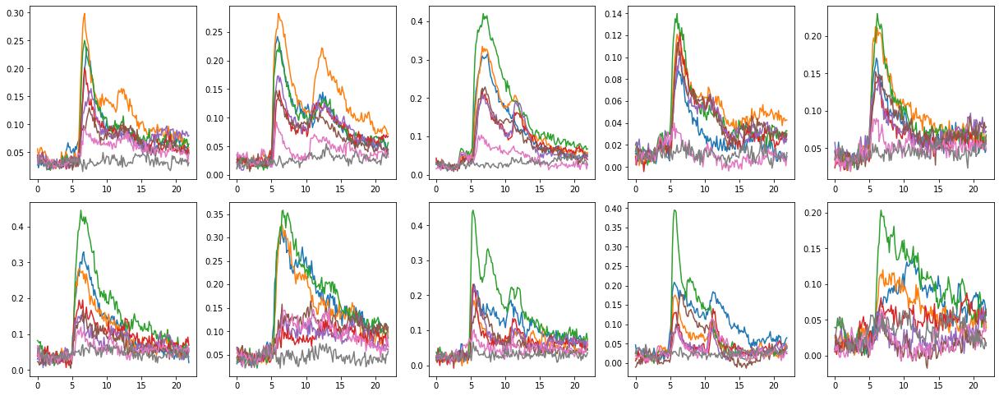

In [22]:
csplus = 'phe'
region = 'Dp'
odor_list = ['phe', 'trp', 'arg', 'tdca', 'tca', 'gca', 'acsf', 'spont']
frame_rate = 30/4
fig = plot_explist_trace_avg(csplus, region, odor_list, frame_rate)

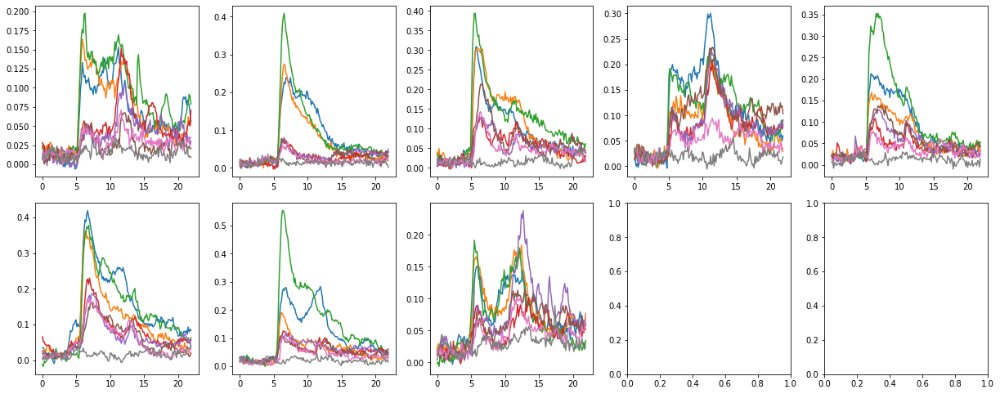

In [23]:
csplus = 'arg'
region = 'Dp'
fig = plot_explist_trace_avg(csplus, region, odor_list, frame_rate)

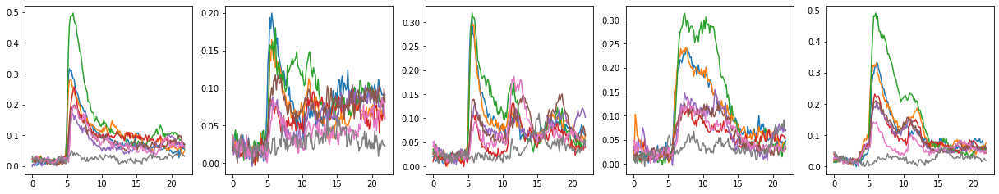

In [15]:
csplus = 'phetrp'
region = 'Dp'
fig = plot_explist_trace_avg(csplus, region, odor_list, frame_rate)

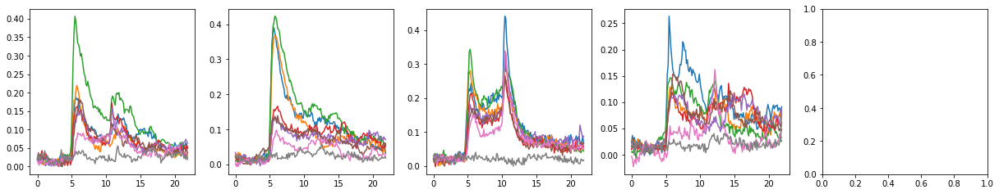

In [8]:
csplus = 'naive'
region = 'Dp'
fig = plot_explist_trace_avg(csplus, region, odor_list, frame_rate)

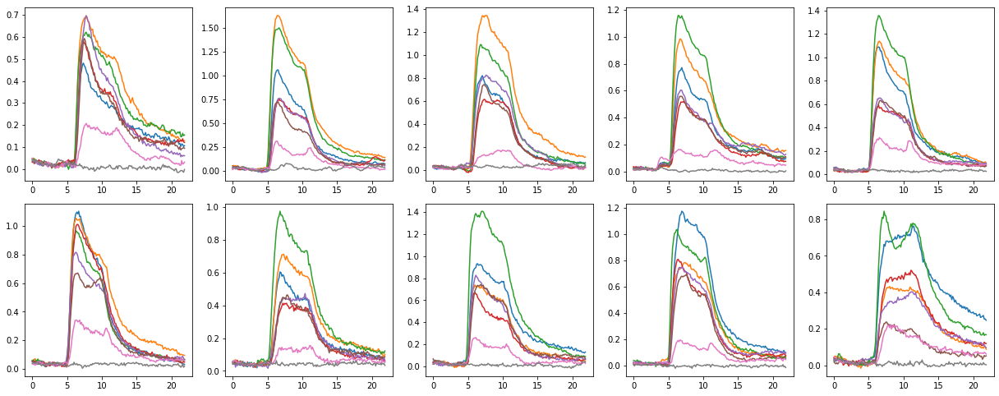

In [18]:
csplus = 'phe'
region = 'OB'
fig = plot_explist_trace_avg(csplus, region, odor_list, frame_rate)

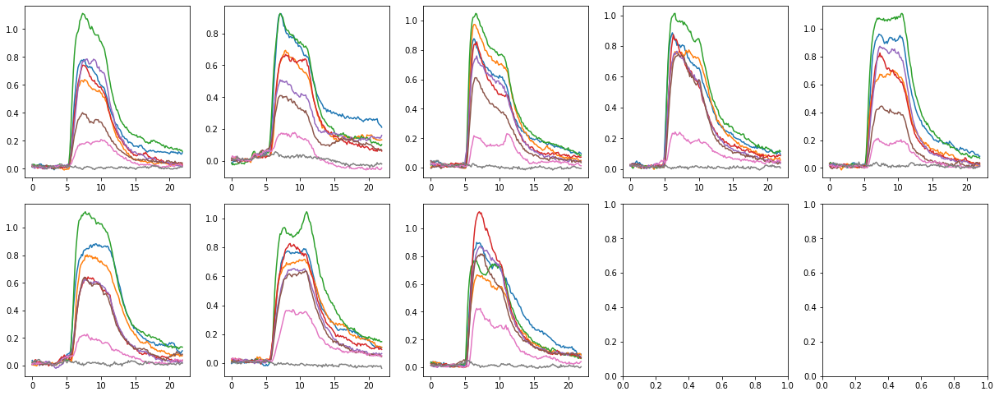

In [19]:
csplus = 'arg'
region = 'OB'
fig = plot_explist_trace_avg(csplus, region, odor_list, frame_rate)

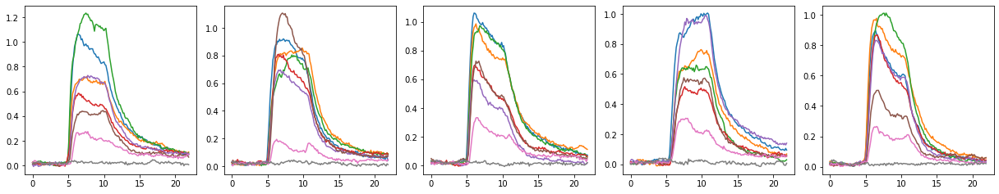

In [24]:
csplus = 'phetrp'
region = 'OB'
fig = plot_explist_trace_avg(csplus, region, odor_list, frame_rate)

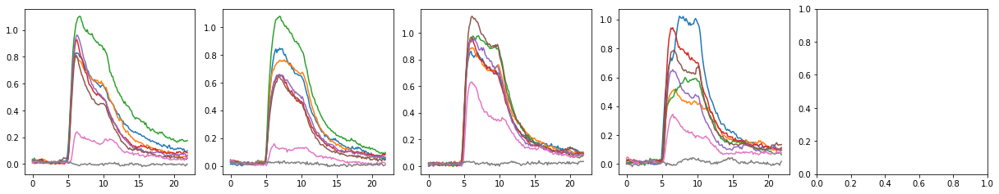

In [9]:
csplus = 'naive'
region = 'OB'
fig = plot_explist_trace_avg(csplus, region, odor_list, frame_rate)

/home/hubo/.local/lib/python3.8/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


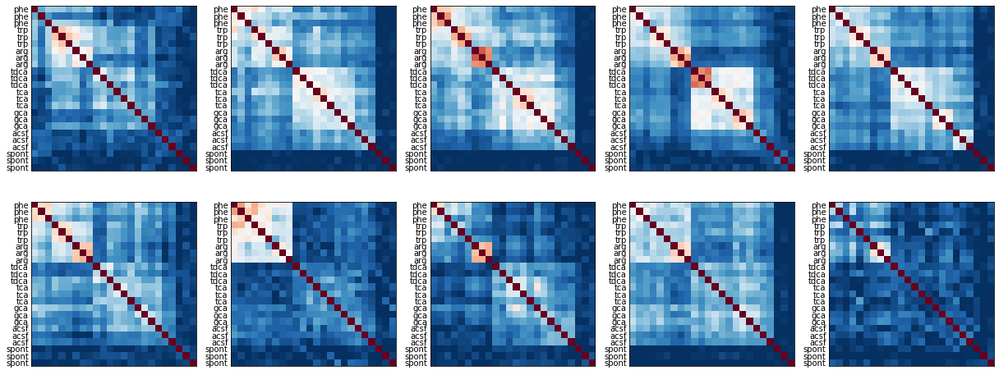

In [13]:
importlib.reload(ptt)
plot_explist_pattern_corr = ecl.plot_explist_decorator(ecl.plot_exp_pattern_correlation,csplus_dict,dfovf_dict,
                                                   sharey=False)
dp_time_window = [6,7]
csplus = 'phe'
region = 'Dp'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=dp_time_window)

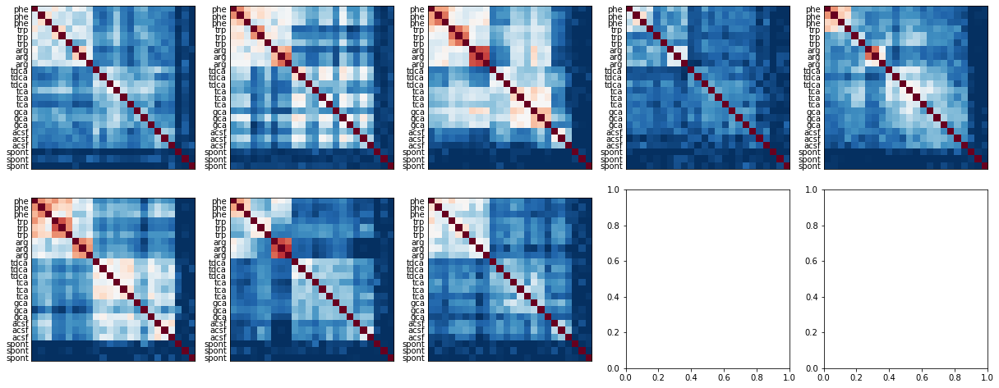

In [23]:
csplus = 'arg'
region = 'Dp'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=dp_time_window)

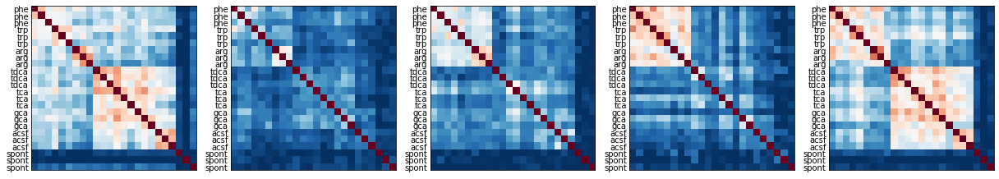

In [24]:
csplus = 'phetrp'
region = 'Dp'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=dp_time_window)

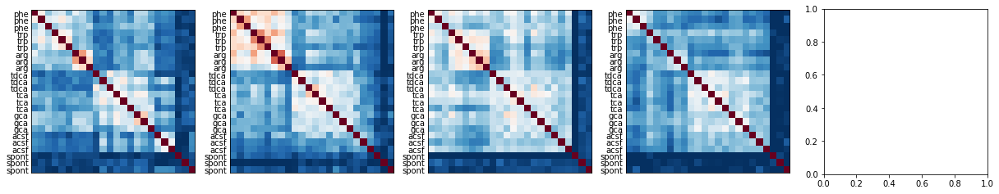

In [14]:
csplus = 'naive'
region = 'Dp'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=dp_time_window)

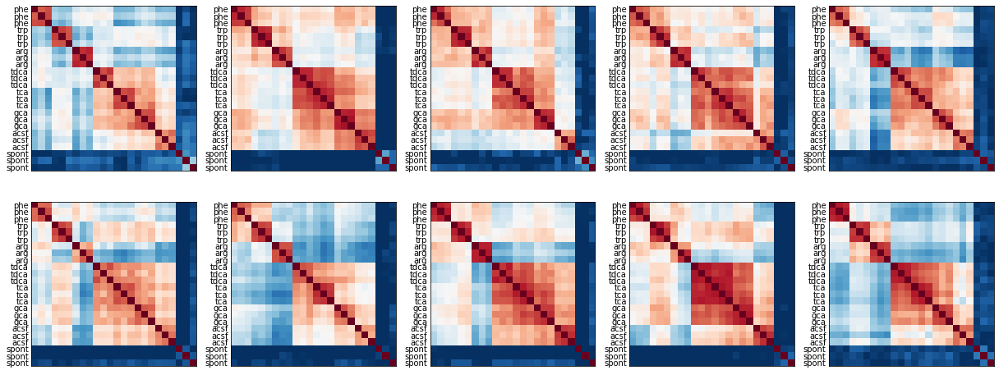

In [26]:
csplus = 'phe'
region = 'OB'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=[6,11])

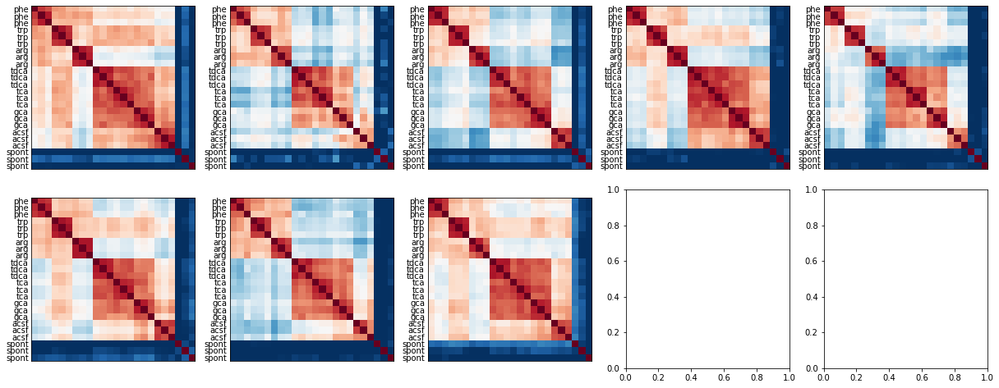

In [27]:
csplus = 'arg'
region = 'OB'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=[6,11])

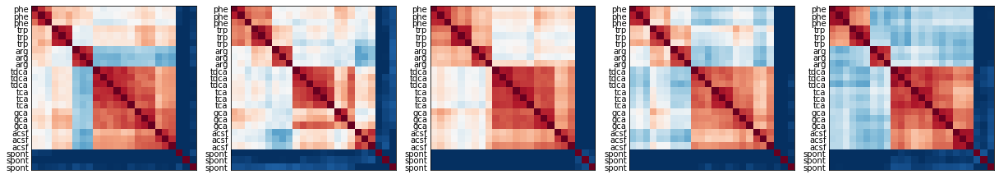

In [28]:
csplus = 'phetrp'
region = 'OB'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=[6,11])

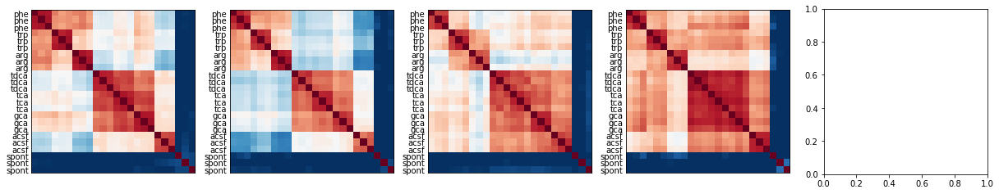

In [15]:
csplus = 'naive'
region = 'OB'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=[6,11])

In [8]:
importlib.reload(ptt)
compute_pattern_explist = ecl.get_data_dict_decorator(exp_list, region_list, dfovf_dict, ptt.bin_and_restack)

In [9]:
tbin = 5
pattern_dict = compute_pattern_explist(tbin)

2021-02-05-DpOBEM-JH9 Dp
2021-03-18-DpOBEM-JH10 Dp
2021-03-19-DpOBEM-JH10 Dp
2021-04-02-DpOBEM-JH11 Dp
2021-04-03-DpOBEM-JH11 Dp
2021-05-01-DpOBEM-JH13 Dp
2021-05-22-DpOBEM-JH14 Dp
2021-07-15-DpOBEM-N2 Dp
2021-07-16-DpOBEM-N3 Dp
2021-07-30-DpOBEM-JH17 Dp
2021-07-31-DpOBEM-JH17 Dp
2021-09-02-DpOBEM-JH18 Dp
2021-09-03-DpOBEM-JH18 Dp
2021-09-04-DpOBEM-JH18 Dp
2021-09-15-DpOBEM-JH20 Dp
2021-09-17-DpOBEM-JH20 Dp
2021-09-18-DpOBEM-JH20 Dp
2021-09-29-DpOBEM-JH21 Dp
2021-10-01-DpOBEM-JH21 Dp
2021-10-02-DpOBEM-JH21 Dp
2021-11-10-DpOBEM-JH23 Dp
2021-11-14-DpOBEM-JH23 Dp
2021-11-24-DpOBEM-JH24 Dp
2021-11-27-DpOBEM-JH24 Dp
2021-11-26-DpOBEM-JH24 Dp
2021-12-10-DpOBEM-N4 Dp
2021-02-05-DpOBEM-JH9 OB
2021-03-18-DpOBEM-JH10 OB
2021-03-19-DpOBEM-JH10 OB
2021-04-02-DpOBEM-JH11 OB
2021-04-03-DpOBEM-JH11 OB
2021-05-01-DpOBEM-JH13 OB
2021-05-22-DpOBEM-JH14 OB
2021-07-15-DpOBEM-N2 OB
2021-07-16-DpOBEM-N3 OB
2021-07-30-DpOBEM-JH17 OB
2021-07-31-DpOBEM-JH17 OB
2021-09-02-DpOBEM-JH18 OB
2021-09-03-DpOBEM-JH18 O

In [30]:
importlib.reload(emb)
standardize_explist = ecl.get_data_dict_decorator(exp_list, region_list, pattern_dict, emb.quantile_all)
std_pattern_dict = standardize_explist(q=1)

2021-02-05-DpOBEM-JH9 Dp
2021-02-05-DpOBEM-JH9 OB
2021-03-18-DpOBEM-JH10 Dp
2021-03-18-DpOBEM-JH10 OB
2021-03-19-DpOBEM-JH10 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with 

2021-03-19-DpOBEM-JH10 OB
2021-04-02-DpOBEM-JH11 Dp
2021-04-02-DpOBEM-JH11 OB
2021-04-03-DpOBEM-JH11 Dp
2021-04-03-DpOBEM-JH11 OB
2021-05-01-DpOBEM-JH13 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with 

2021-05-01-DpOBEM-JH13 OB
2021-05-22-DpOBEM-JH14 Dp
2021-05-22-DpOBEM-JH14 OB
2021-07-15-DpOBEM-N2 Dp
2021-07-15-DpOBEM-N2 OB
2021-07-16-DpOBEM-N3 Dp
2021-07-16-DpOBEM-N3 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with 

2021-07-30-DpOBEM-JH17 Dp
2021-07-30-DpOBEM-JH17 OB
2021-07-31-DpOBEM-JH17 Dp
2021-07-31-DpOBEM-JH17 OB
2021-09-02-DpOBEM-JH18 Dp
2021-09-02-DpOBEM-JH18 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with 

2021-09-03-DpOBEM-JH18 Dp
2021-09-03-DpOBEM-JH18 OB
2021-09-04-DpOBEM-JH18 Dp
2021-09-04-DpOBEM-JH18 OB
2021-09-15-DpOBEM-JH20 Dp
2021-09-15-DpOBEM-JH20 OB
2021-09-17-DpOBEM-JH20 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with 

2021-09-17-DpOBEM-JH20 OB
2021-09-18-DpOBEM-JH20 Dp
2021-09-18-DpOBEM-JH20 OB
2021-09-29-DpOBEM-JH21 Dp
2021-09-29-DpOBEM-JH21 OB
2021-10-01-DpOBEM-JH21 Dp
2021-10-01-DpOBEM-JH21 OB
2021-10-02-DpOBEM-JH21 Dp
2021-10-02-DpOBEM-JH21 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with 

In [31]:
compute_pca_explist = ecl.get_data_dict_decorator(exp_list, region_list, std_pattern_dict, emb.compute_pca)

In [32]:
n_components = None
pca_all_dict = compute_pca_explist(n_components) 

/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-02-05-DpOBEM-JH9 Dp
2021-02-05-DpOBEM-JH9 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-18-DpOBEM-JH10 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-18-DpOBEM-JH10 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-19-DpOBEM-JH10 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-19-DpOBEM-JH10 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-02-DpOBEM-JH11 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-02-DpOBEM-JH11 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-03-DpOBEM-JH11 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-03-DpOBEM-JH11 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-01-DpOBEM-JH13 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-01-DpOBEM-JH13 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-22-DpOBEM-JH14 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-22-DpOBEM-JH14 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-15-DpOBEM-N2 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-15-DpOBEM-N2 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-16-DpOBEM-N3 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-16-DpOBEM-N3 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-30-DpOBEM-JH17 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-30-DpOBEM-JH17 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-31-DpOBEM-JH17 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-31-DpOBEM-JH17 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-02-DpOBEM-JH18 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-02-DpOBEM-JH18 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-03-DpOBEM-JH18 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-03-DpOBEM-JH18 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-04-DpOBEM-JH18 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-04-DpOBEM-JH18 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-15-DpOBEM-JH20 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-15-DpOBEM-JH20 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-17-DpOBEM-JH20 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-17-DpOBEM-JH20 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-18-DpOBEM-JH20 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-18-DpOBEM-JH20 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-29-DpOBEM-JH21 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-29-DpOBEM-JH21 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-10-01-DpOBEM-JH21 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-10-01-DpOBEM-JH21 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-10-02-DpOBEM-JH21 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-10-02-DpOBEM-JH21 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


['2021-02-05-DpOBEM-JH9', '2021-03-18-DpOBEM-JH10', '2021-03-19-DpOBEM-JH10', '2021-04-02-DpOBEM-JH11', '2021-04-03-DpOBEM-JH11', '2021-05-01-DpOBEM-JH13', '2021-05-22-DpOBEM-JH14', '2021-09-15-DpOBEM-JH20', '2021-09-17-DpOBEM-JH20', '2021-09-18-DpOBEM-JH20']


<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

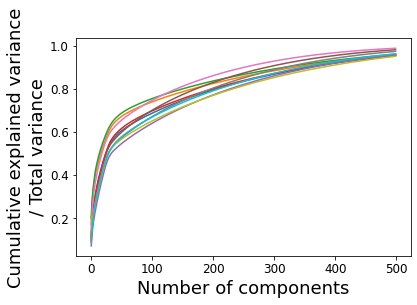

In [33]:
region = 'Dp'
csplus = 'phe'
xexp_list = csplus_dict[csplus]
print(xexp_list)
plt.subplots()#figsize=[10,10])
for exp in xexp_list:
    pca1 = pca_all_dict[exp][region]['pca']
    plt.plot(np.cumsum(pca1.explained_variance_ratio_[:500]),label=exp)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance\n/ Total variance')
plt.tight_layout
#plt.legend()



['2021-02-05-DpOBEM-JH9', '2021-03-18-DpOBEM-JH10', '2021-03-19-DpOBEM-JH10', '2021-04-02-DpOBEM-JH11', '2021-04-03-DpOBEM-JH11', '2021-05-01-DpOBEM-JH13', '2021-05-22-DpOBEM-JH14', '2021-09-15-DpOBEM-JH20', '2021-09-17-DpOBEM-JH20', '2021-09-18-DpOBEM-JH20']


<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

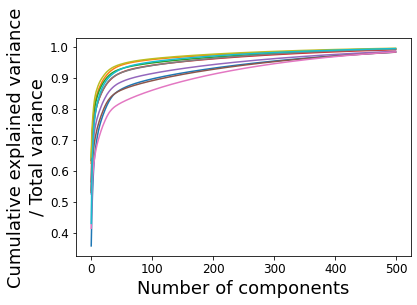

In [34]:
region = 'OB'
csplus = 'phe'
xexp_list = csplus_dict[csplus]
print(xexp_list)
plt.subplots()#figsize=[10,10])
for exp in xexp_list:
    pca1 = pca_all_dict[exp][region]['pca']
    plt.plot(np.cumsum(pca1.explained_variance_ratio_[:500]),label=exp)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance\n/ Total variance')
plt.tight_layout
#plt.legend()

['2021-07-30-DpOBEM-JH17', '2021-07-31-DpOBEM-JH17', '2021-09-02-DpOBEM-JH18', '2021-09-03-DpOBEM-JH18', '2021-09-04-DpOBEM-JH18', '2021-09-29-DpOBEM-JH21', '2021-10-01-DpOBEM-JH21', '2021-10-02-DpOBEM-JH21']


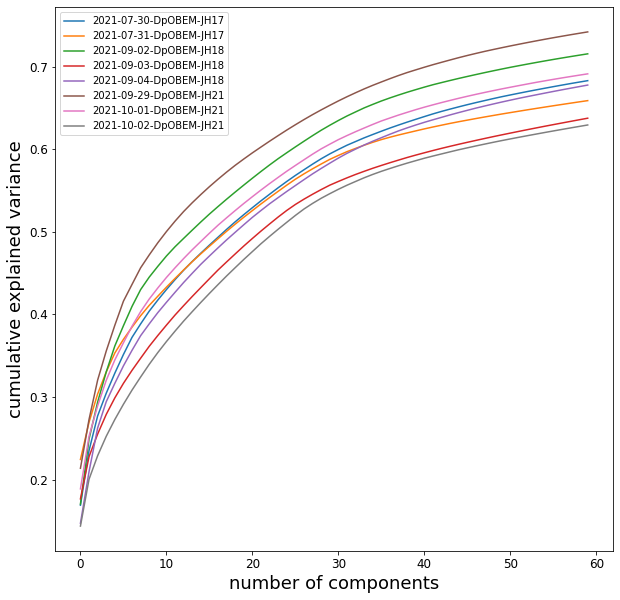

In [35]:
region = 'Dp'
csplus = 'arg'
xexp_list = csplus_dict[csplus]
plt.subplots(figsize=[10,10])
print(xexp_list)
for exp in xexp_list:
    pca1 = pca_all_dict[exp][region]['pca']
    plt.plot(np.cumsum(pca1.explained_variance_ratio_[:60]),label=exp)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.legend()



['2021-07-15-DpOBEM-N2', '2021-07-16-DpOBEM-N3']


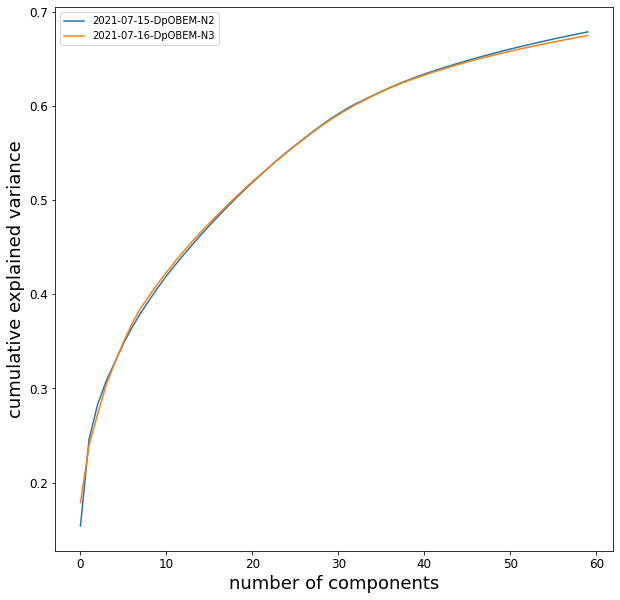

In [36]:
region = 'Dp'
csplus = 'naive'
xexp_list = csplus_dict[csplus]
plt.subplots(figsize=[10,10])
print(xexp_list)
for exp in xexp_list:
    pca1 = pca_all_dict[exp][region]['pca']
    plt.plot(np.cumsum(pca1.explained_variance_ratio_[:60]),label=exp)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.legend()



In [37]:
n_components = 200
pca_dict = compute_pca_explist(n_components) 

2021-02-05-DpOBEM-JH9 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-02-05-DpOBEM-JH9 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-18-DpOBEM-JH10 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-18-DpOBEM-JH10 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-19-DpOBEM-JH10 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-19-DpOBEM-JH10 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-02-DpOBEM-JH11 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-02-DpOBEM-JH11 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-03-DpOBEM-JH11 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-03-DpOBEM-JH11 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-01-DpOBEM-JH13 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-01-DpOBEM-JH13 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-22-DpOBEM-JH14 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-22-DpOBEM-JH14 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-15-DpOBEM-N2 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-15-DpOBEM-N2 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-16-DpOBEM-N3 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-16-DpOBEM-N3 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-30-DpOBEM-JH17 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-30-DpOBEM-JH17 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-31-DpOBEM-JH17 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-31-DpOBEM-JH17 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-02-DpOBEM-JH18 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-02-DpOBEM-JH18 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-03-DpOBEM-JH18 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-03-DpOBEM-JH18 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-04-DpOBEM-JH18 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-04-DpOBEM-JH18 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-15-DpOBEM-JH20 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-15-DpOBEM-JH20 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-17-DpOBEM-JH20 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-17-DpOBEM-JH20 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-18-DpOBEM-JH20 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-18-DpOBEM-JH20 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-29-DpOBEM-JH21 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-29-DpOBEM-JH21 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-10-01-DpOBEM-JH21 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-10-01-DpOBEM-JH21 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-10-02-DpOBEM-JH21 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-10-02-DpOBEM-JH21 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


0.027037592467947166


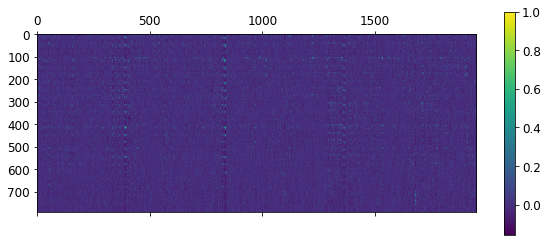

In [38]:
df = list(std_pattern_dict.values())[1]['Dp']
df.max().max()
plt.matshow(df)
plt.colorbar()
print(df.values.std())
#plt.clim((-1,3))

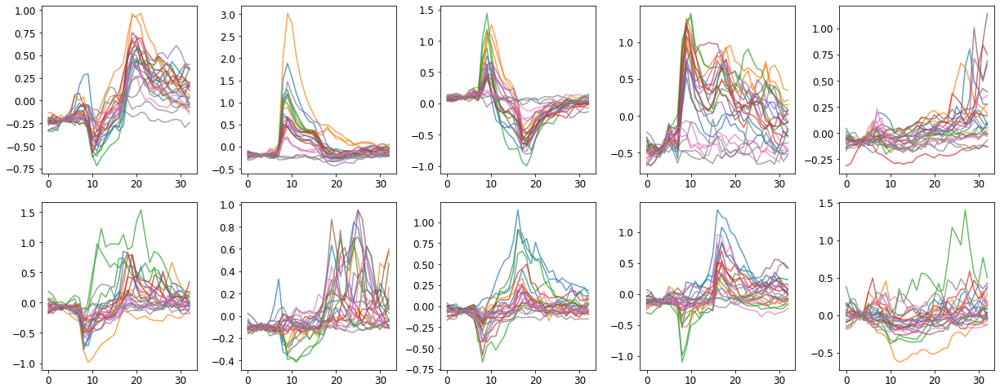

In [39]:
#importlib.reload(emb)
plot_explist_pca_1d = ecl.plot_explist_decorator(emb.plot_embed_1d, csplus_dict, pca_dict)
csplus = 'phe'
region = 'Dp'
fig = plot_explist_pca_1d(csplus, region, 1)

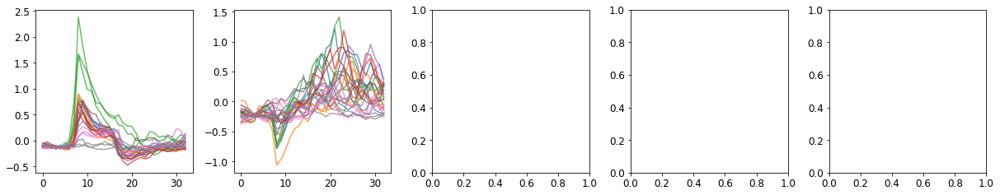

In [40]:
csplus = 'naive'
region = 'Dp'
fig = plot_explist_pca_1d(csplus, region, 1)

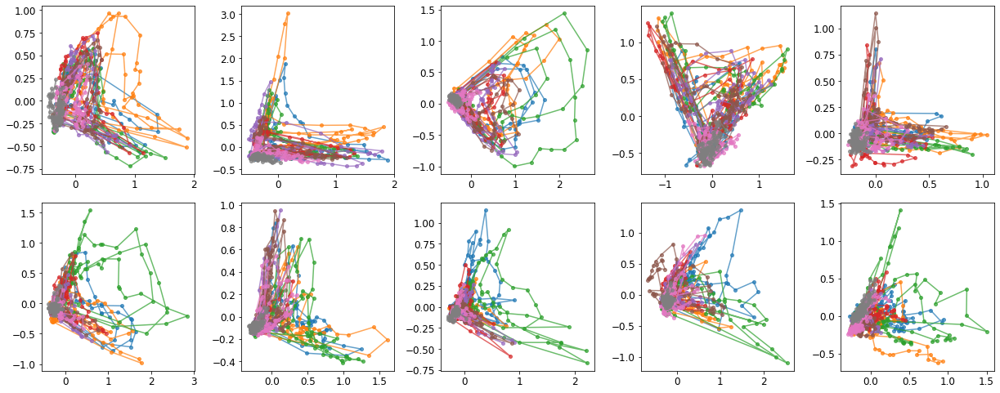

In [41]:
plot_explist_pca= ecl.plot_explist_decorator(emb.plot_embed_2d, csplus_dict, pca_dict)
csplus = 'phe'
region = 'Dp'
fig = plot_explist_pca(csplus, region, (0,1))

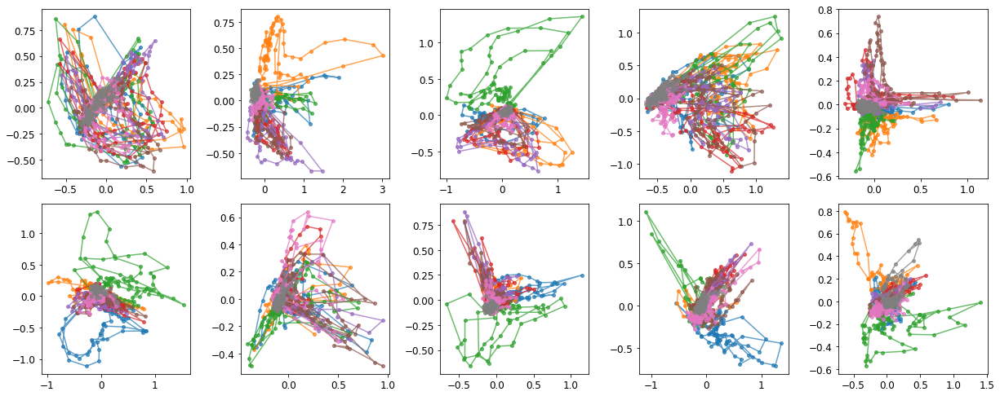

In [42]:
csplus = 'phe'
region = 'Dp'
fig = plot_explist_pca(csplus, region, (1,2))

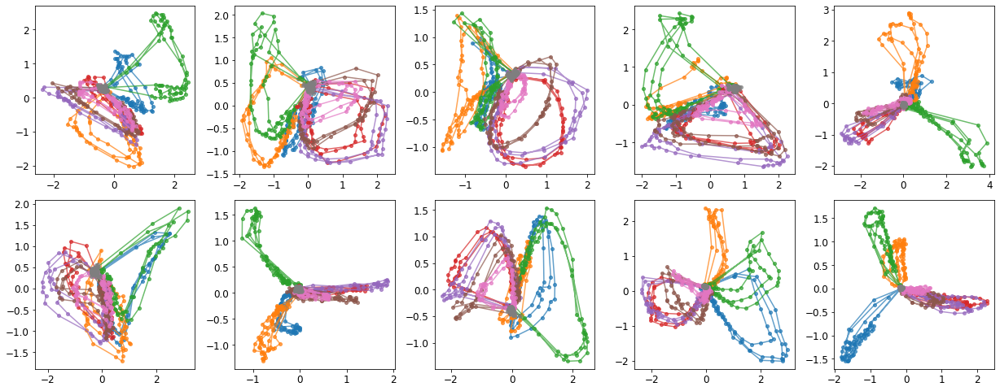

In [43]:
csplus = 'phe'
region = 'OB'
fig = plot_explist_pca(csplus, region, (1,2))

In [44]:
import sys
sys.path.insert(0, '/home/hubo/Projects/Ca_imaging/scripts/cca/pyrcca')
import rcca
rcca.__file__

'/home/hubo/Projects/Ca_imaging/scripts/cca/pyrcca/rcca/__init__.py'

In [45]:
importlib.reload(rcca)
# Create a cca object as an instantiation of the CCA object class. 
nComponents = 10
cca = rcca.CCA(kernelcca = False, reg = 0., numCC = nComponents)
region = 'Dp'
csplus = 'phe'
csexp_list = csplus_dict[csplus].copy()
csplus = 'arg'
csexp_list.extend(csplus_dict[csplus])
csplus = 'naive'
csexp_list.extend(csplus_dict[csplus])
# del csexp_list[9]
print(csexp_list)
data_list = [pca_dict[exp][region]['latent'] for exp in csexp_list]
#randmat = np.random.normal(scale=pp.std(), size=pp.shape)
#data_list.append(randmat)
# Use the train() method to find a CCA mapping between the two training sets.
cca.train(data_list)

['2021-02-05-DpOBEM-JH9', '2021-03-18-DpOBEM-JH10', '2021-03-19-DpOBEM-JH10', '2021-04-02-DpOBEM-JH11', '2021-04-03-DpOBEM-JH11', '2021-05-01-DpOBEM-JH13', '2021-05-22-DpOBEM-JH14', '2021-09-15-DpOBEM-JH20', '2021-09-17-DpOBEM-JH20', '2021-09-18-DpOBEM-JH20', '2021-07-30-DpOBEM-JH17', '2021-07-31-DpOBEM-JH17', '2021-09-02-DpOBEM-JH18', '2021-09-03-DpOBEM-JH18', '2021-09-04-DpOBEM-JH18', '2021-09-29-DpOBEM-JH21', '2021-10-01-DpOBEM-JH21', '2021-10-02-DpOBEM-JH21', '2021-07-15-DpOBEM-N2', '2021-07-16-DpOBEM-N3']
Training CCA, kernel = None, regularization = 0.0000, 10 components


In [46]:
rcca.__file__

'/home/hubo/Projects/Ca_imaging/scripts/cca/pyrcca/rcca/__init__.py'

In [47]:
cca.ws

[array([[-1.04671356e-02, -4.84940995e-03, -4.76351431e-03, ...,
         -2.61328302e-03,  2.85051004e-03, -1.77628525e-03],
        [ 3.58209661e-03, -6.74195429e-04, -3.00910994e-03, ...,
         -1.15147414e-04,  2.05020346e-03, -6.92670262e-04],
        [-2.01978106e-04, -1.73342492e-04, -4.54642803e-03, ...,
         -3.36636849e-03, -3.65866266e-03,  4.55671915e-03],
        ...,
        [ 1.25345313e-03,  2.03378017e-04,  4.00970267e-03, ...,
          2.21525012e-03,  3.86912737e-03,  7.48799411e-04],
        [-2.67153378e-03,  3.69292488e-03, -2.02644334e-04, ...,
         -8.69951209e-04,  2.13576443e-03,  1.54409334e-03],
        [-1.43710115e-03,  1.98328882e-03, -8.29379526e-05, ...,
          2.79862831e-03, -1.97321820e-04, -1.54266457e-03]]),
 array([[-3.45376191e-03, -1.99566144e-03, -1.51066762e-03, ...,
         -9.51784178e-04,  8.86048155e-05,  7.69261420e-04],
        [-8.97753454e-03, -6.24015370e-03, -7.09312870e-03, ...,
          3.48376954e-04,  1.38164158e

['phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'arg', 'arg', 'arg', 'arg', 'arg', 'arg', 'arg', 'arg', 'naive', 'naive']


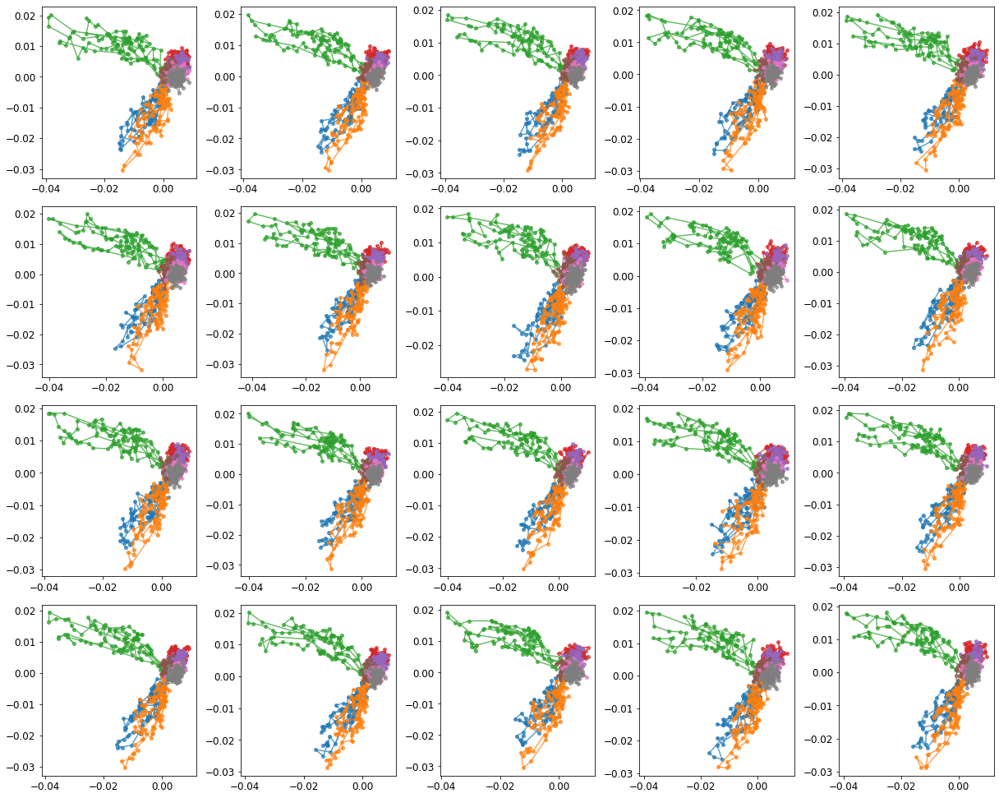

In [51]:
importlib.reload(ecl)
xx_dict = dict(exp_list)
xx_list = [xx_dict[exp] for exp in csexp_list]
print(xx_list)
plot_func = emb.plot_embed_2d
ccacomp_list = [dict(latent=comps, index=pca_dict[exp_list[idx][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(0,1))

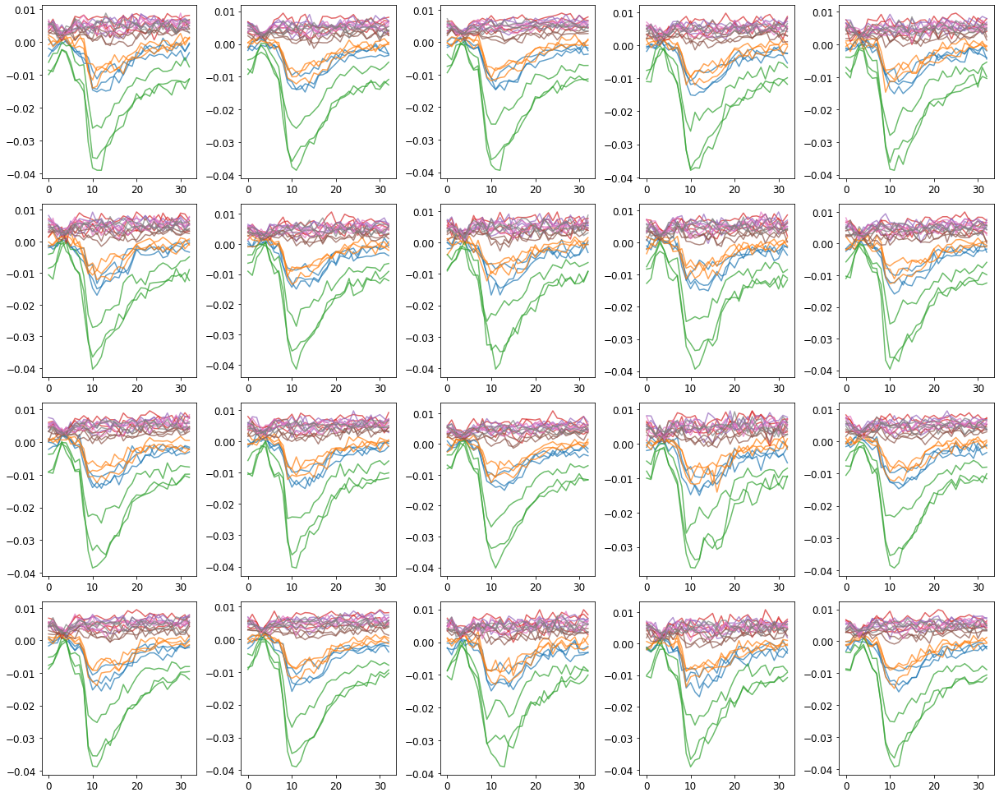

In [49]:
#plot_func = emb.plot_embed_1d
#ccacomp_list = [dict(latent=comps, index=pca_dict[exp_list[idx][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
#fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=0)

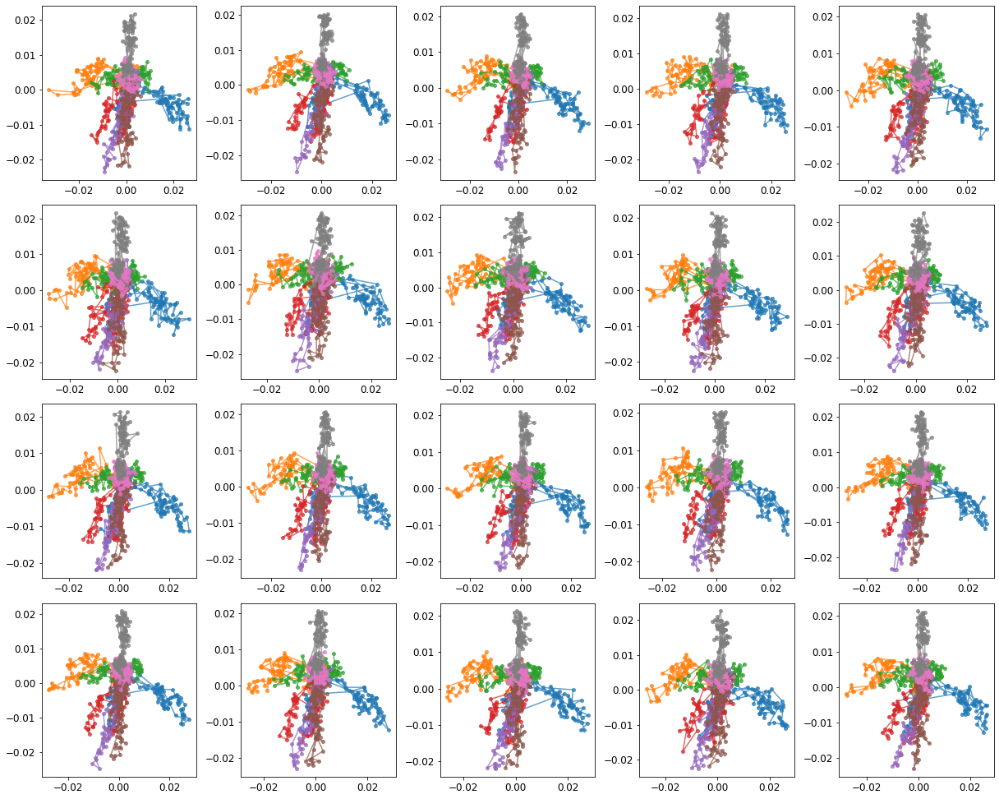

In [52]:
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(2,3))

In [ ]:
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(4,5))

In [ ]:
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(6,7))

In [53]:
# Create a cca object as an instantiation of the CCA object class. 
nComponents = 10
cca = rcca.CCA(kernelcca = False, reg = 0., numCC = nComponents)
#region_list = ['Dp', 'OB']
#exp_name = '2021-02-05-DpOBEM-JH9'
exp_region_list = [('2021-02-05-DpOBEM-JH9', 'Dp'), ('2021-03-19-DpOBEM-JH10','OB'), ('2021-07-15-DpOBEM-N2','Dp'),('2021-09-18-DpOBEM-JH20','OB')]
data_list = [pca_dict[expreg[0]][expreg[1]]['latent'] for expreg in exp_region_list]
expreg = exp_region_list[0]
pp = pca_dict[expreg[0]][expreg[1]]['latent']
randmat = np.random.normal(scale=pp.std(), size=pp.shape)
data_list.append(randmat)
# Use the train() method to find a CCA mapping between the two training sets.
cca.train(data_list)

Training CCA, kernel = None, regularization = 0.0000, 10 components


In [60]:
nComponents = 10
cca = rcca.CCA(kernelcca = False, reg = 0., numCC = nComponents)
region = 'OB'
csplus = 'phe'
csexp_list = csplus_dict[csplus].copy()
csplus = 'arg'
csexp_list.extend(csplus_dict[csplus])
csplus = 'naive'
csexp_list.extend(csplus_dict[csplus])
# del csexp_list[9]
print(csexp_list)
data_list = [pca_dict[exp][region]['latent'] for exp in csexp_list]
randmat = np.random.normal(scale=pp.std(), size=pp.shape)
data_list.append(randmat)
# Use the train() method to find a CCA mapping between the two training sets.
cca.train(data_list)

['2021-02-05-DpOBEM-JH9', '2021-03-18-DpOBEM-JH10', '2021-03-19-DpOBEM-JH10', '2021-04-02-DpOBEM-JH11', '2021-04-03-DpOBEM-JH11', '2021-05-01-DpOBEM-JH13', '2021-05-22-DpOBEM-JH14', '2021-09-15-DpOBEM-JH20', '2021-09-17-DpOBEM-JH20', '2021-09-18-DpOBEM-JH20', '2021-07-30-DpOBEM-JH17', '2021-07-31-DpOBEM-JH17', '2021-09-02-DpOBEM-JH18', '2021-09-03-DpOBEM-JH18', '2021-09-04-DpOBEM-JH18', '2021-09-29-DpOBEM-JH21', '2021-10-01-DpOBEM-JH21', '2021-10-02-DpOBEM-JH21', '2021-07-15-DpOBEM-N2', '2021-07-16-DpOBEM-N3']
Training CCA, kernel = None, regularization = 0.0000, 10 components


['phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'arg', 'arg', 'arg', 'arg', 'arg', 'arg', 'arg', 'arg', 'naive', 'naive']


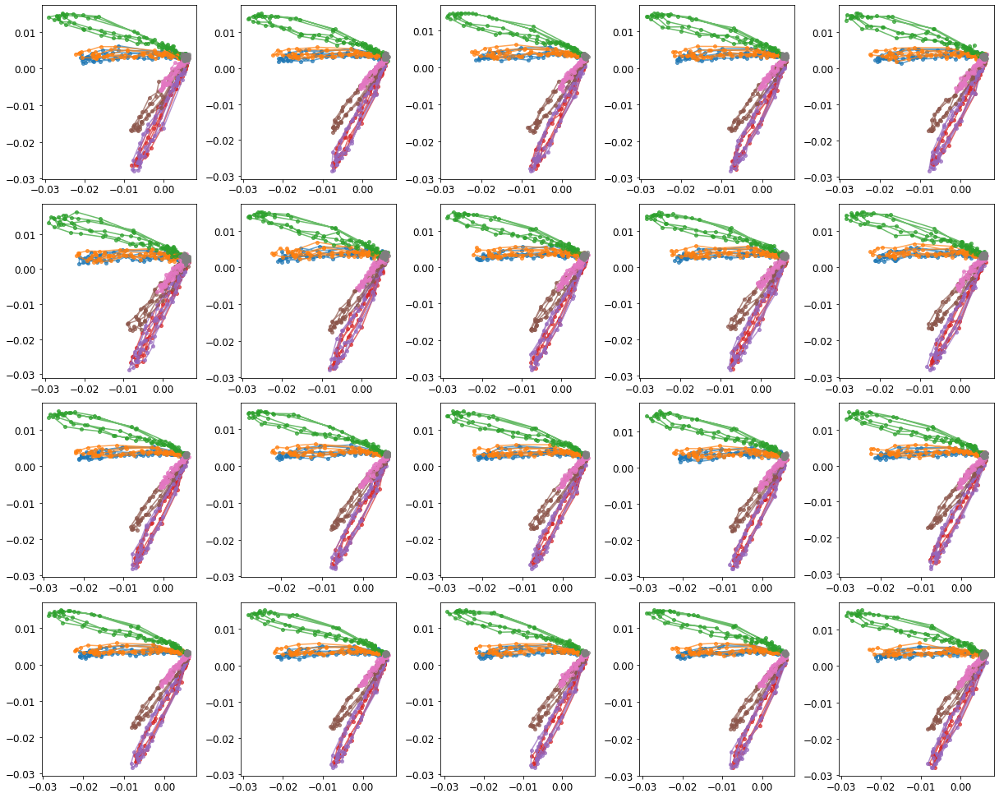

In [55]:
importlib.reload(ecl)
xx_dict = dict(exp_list)
xx_list = [xx_dict[exp] for exp in csexp_list]
print(xx_list)
plot_func = emb.plot_embed_2d
ccacomp_list = [dict(latent=comps, index=pca_dict[exp_list[idx][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(0,1))

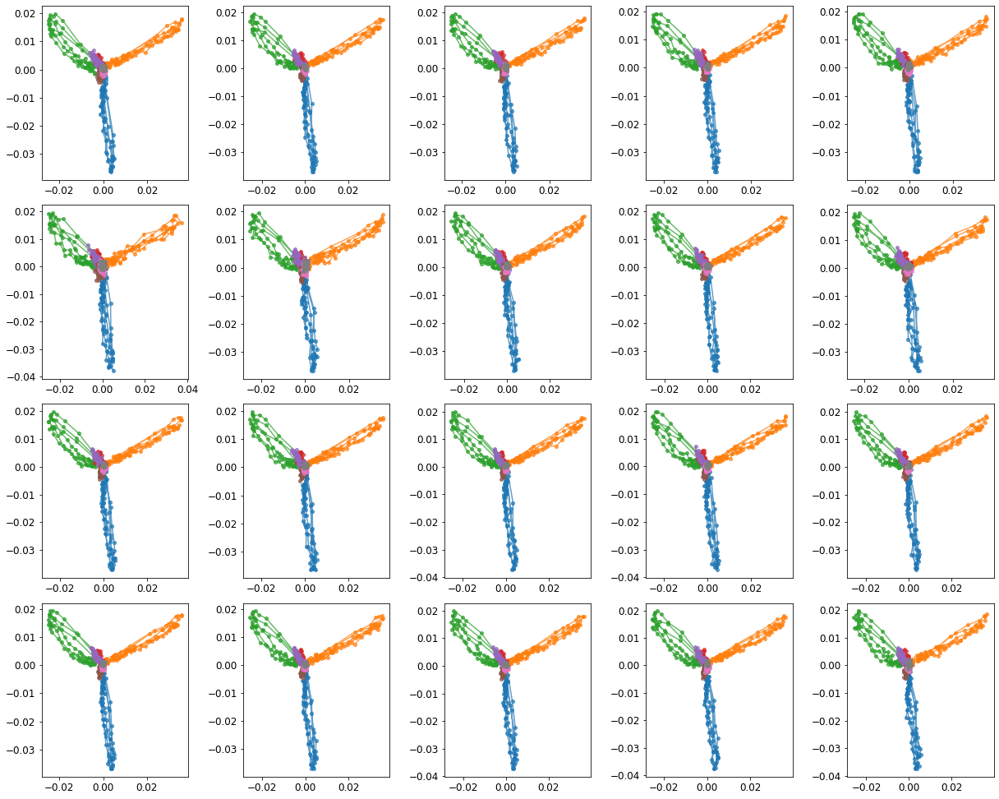

In [56]:
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(2,3))

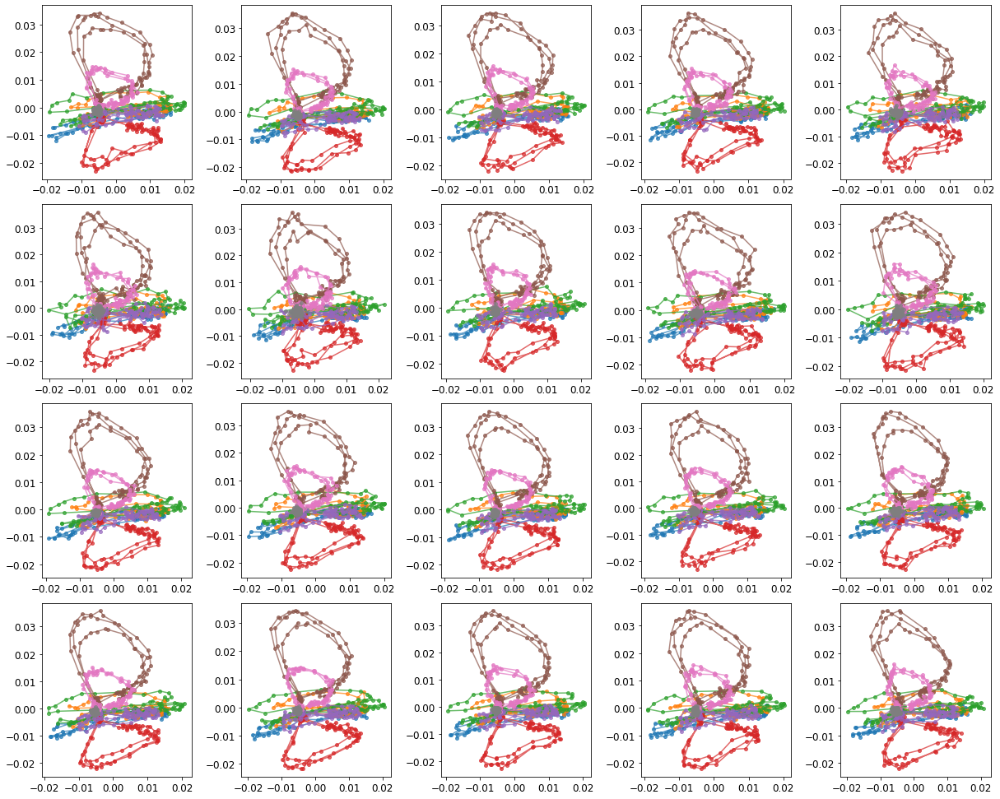

In [57]:
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(4,5))

['phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'arg', 'arg', 'arg', 'arg', 'arg', 'arg', 'arg', 'arg', 'naive', 'naive']


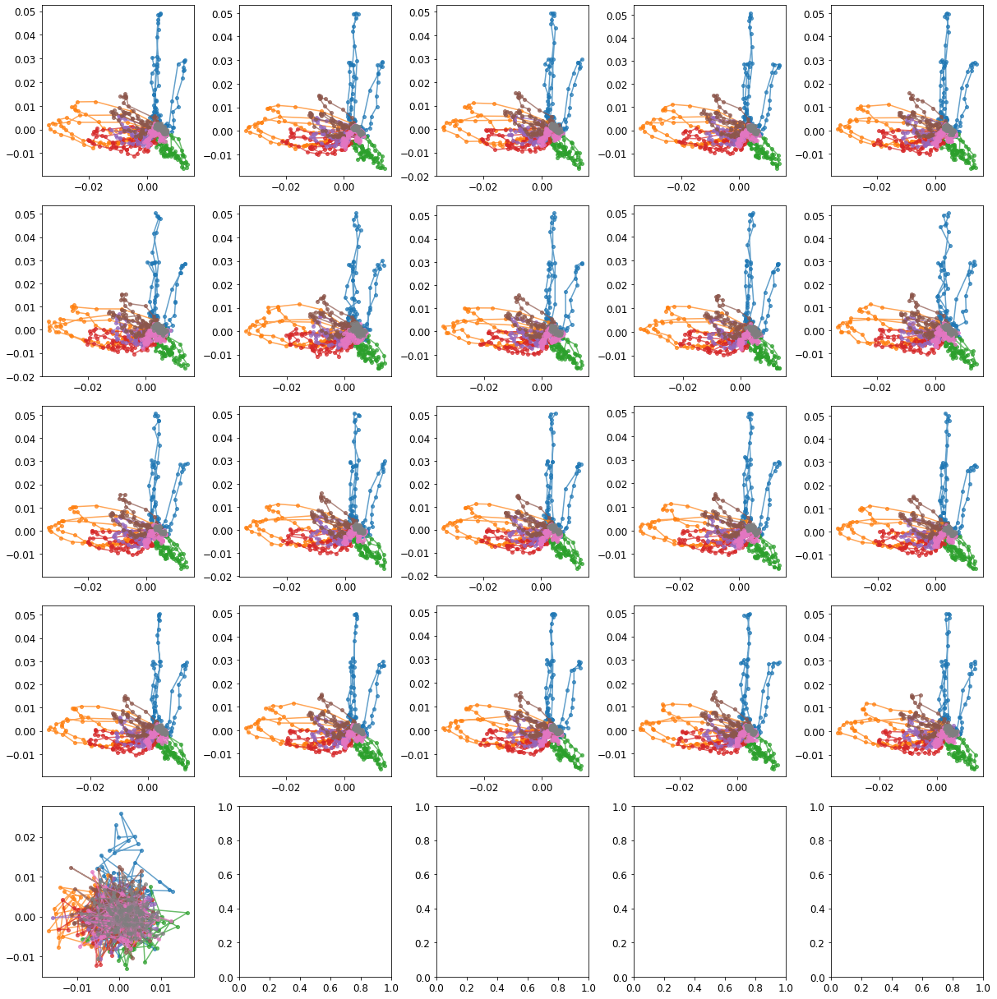

In [62]:
importlib.reload(ecl)
xx_dict = dict(exp_list)
xx_list = [xx_dict[exp] for exp in csexp_list]
print(xx_list)
plot_func = emb.plot_embed_2d
ccacomp_list = [dict(latent=comps, index=pca_dict[exp_list[0][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(0,1))

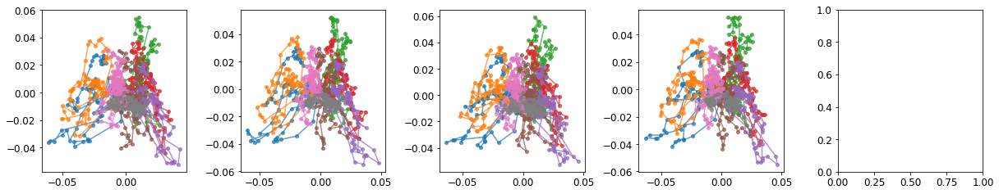

In [134]:
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(2,3))

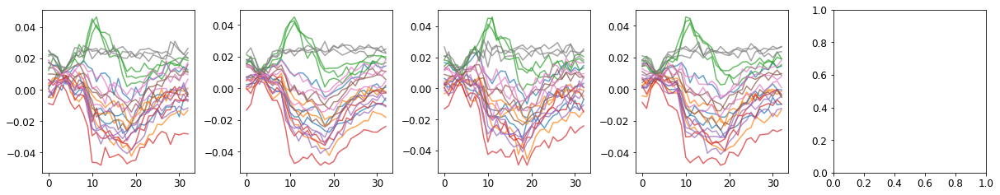

In [136]:
plot_func = emb.plot_embed_1d
ccacomp_list = [dict(latent=comps, index=svd_dict[exp_list[idx][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=1)

In [43]:
compute_svd_explist = ecl.get_data_dict_decorator(exp_list, region_list, std_pattern_dict, emb.compute_svd)
n_components = 10
svd_dict = compute_svd_explist(n_components)

2021-02-05-DpOBEM-JH9 Dp
2021-02-05-DpOBEM-JH9 OB
2021-03-18-DpOBEM-JH10 Dp
2021-03-18-DpOBEM-JH10 OB
2021-03-19-DpOBEM-JH10 Dp
2021-03-19-DpOBEM-JH10 OB
2021-04-02-DpOBEM-JH11 Dp
2021-04-02-DpOBEM-JH11 OB
2021-04-03-DpOBEM-JH11 Dp
2021-04-03-DpOBEM-JH11 OB
2021-05-01-DpOBEM-JH13 Dp
2021-05-01-DpOBEM-JH13 OB
2021-05-22-DpOBEM-JH14 Dp
2021-05-22-DpOBEM-JH14 OB
2021-07-15-DpOBEM-N2 Dp
2021-07-15-DpOBEM-N2 OB
2021-07-16-DpOBEM-N3 Dp
2021-07-16-DpOBEM-N3 OB
2021-07-30-DpOBEM-JH17 Dp
2021-07-30-DpOBEM-JH17 OB
2021-07-31-DpOBEM-JH17 Dp
2021-07-31-DpOBEM-JH17 OB
2021-09-02-DpOBEM-JH18 Dp
2021-09-02-DpOBEM-JH18 OB
2021-09-03-DpOBEM-JH18 Dp
2021-09-03-DpOBEM-JH18 OB
2021-09-04-DpOBEM-JH18 Dp
2021-09-04-DpOBEM-JH18 OB
2021-09-15-DpOBEM-JH20 Dp
2021-09-15-DpOBEM-JH20 OB
2021-09-17-DpOBEM-JH20 Dp
2021-09-17-DpOBEM-JH20 OB
2021-09-18-DpOBEM-JH20 Dp
2021-09-18-DpOBEM-JH20 OB


(792,)


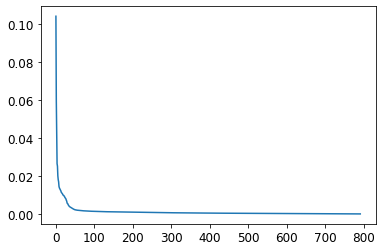

In [54]:
results = svd_dict['2021-02-05-DpOBEM-JH9']['Dp']
print(results['sigma'].shape)
sigma = results['sigma']
lam = sigma**2/(sigma.shape[0]-1)
plt.plot(lam/lam.sum())

In [23]:
from sklearn.preprocessing import StandardScaler
pattern = pattern_dict['2021-02-05-DpOBEM-JH9']['Dp']
data = pattern# [[0, 0], [0, 0], [1, 1], [1, 1]]
scaler = StandardScaler()
print(pattern)
print(scaler.fit(data))
print(scaler.mean_)
pattern_scaled = scaler.transform(data)
#print(scaler.transform([[2, 2]]))

plane                    0                                                    \
neuron                 0         1         2         3         4         5     
odor  trial time                                                               
phe   0     0    -0.068644 -0.000445 -0.121525 -0.262269  0.001295  0.079250   
            1    -0.005722 -0.042060 -0.274035 -0.124323  0.085328  0.079733   
            2    -0.035019 -0.043920  0.073197  0.006313  0.065023 -0.079671   
            3     0.024213  0.014006  0.136291 -0.082125  0.034153 -0.096131   
            4    -0.040315  0.015268 -0.151302  0.016716 -0.008434  0.072466   
...                    ...       ...       ...       ...       ...       ...   
spont 2     28    0.664561  0.009107 -0.279247 -0.313683  0.001938 -0.124895   
            29    0.564962 -0.042475 -0.189746 -0.229749  0.116805 -0.084685   
            30    0.288038  0.076863 -0.246191 -0.151342  0.170965 -0.099405   
            31    0.101522  0.037636 -0.

/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


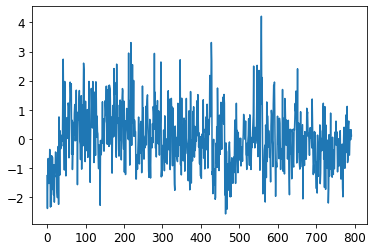

In [31]:
pattern_scaled.shape
plt.plot(pattern_scaled[:,1000])

In [ ]:
plot_explist_svd= ecl.plot_explist_decorator(emb.plot_embed_2d, csplus_dict, svd_dict)
csplus = 'phe'
region = 'Dp'
fig = plot_explist_svd(csplus, region, (0,1))

In [ ]:
csplus = 'arg'
region = 'Dp'
fig = plot_explist_svd(csplus, region, (0,1))

In [ ]:
csplus = 'naive'
region = 'Dp'
fig = plot_explist_svd(csplus, region, (0,1))

In [ ]:
csplus = 'phe'
region = 'Dp'
fig = plot_explist_svd(csplus, region, (1,2))

In [ ]:
csplus = 'arg'
region = 'Dp'
fig = plot_explist_svd(csplus, region, (1,2))

In [ ]:
csplus = 'naive'
region = 'Dp'
fig = plot_explist_svd(csplus, region, (1,2))

In [ ]:
csplus = 'phe'
region = 'Dp'
fig = plot_explist_svd(csplus, region, (2,3))

In [ ]:
csplus = 'arg'
region = 'Dp'
fig = plot_explist_svd(csplus, region, (2,3))

In [ ]:
csplus = 'naive'
region = 'Dp'
fig = plot_explist_svd(csplus, region, (2,3))

In [ ]:
csplus = 'phe'
region = 'OB'
fig = plot_explist_svd(csplus, region, (0,1))
csplus = 'arg'
region = 'OB'
fig = plot_explist_svd(csplus, region, (0,1))
csplus = 'naive'
region = 'OB'
fig = plot_explist_svd(csplus, region, (0,1))

In [ ]:
components = (2,3)
csplus = 'phe'
region = 'OB'
fig = plot_explist_svd(csplus, region, components)
csplus = 'arg'
region = 'OB'
fig = plot_explist_svd(csplus, region, components)
csplus = 'naive'
region = 'OB'
fig = plot_explist_svd(csplus, region, components)

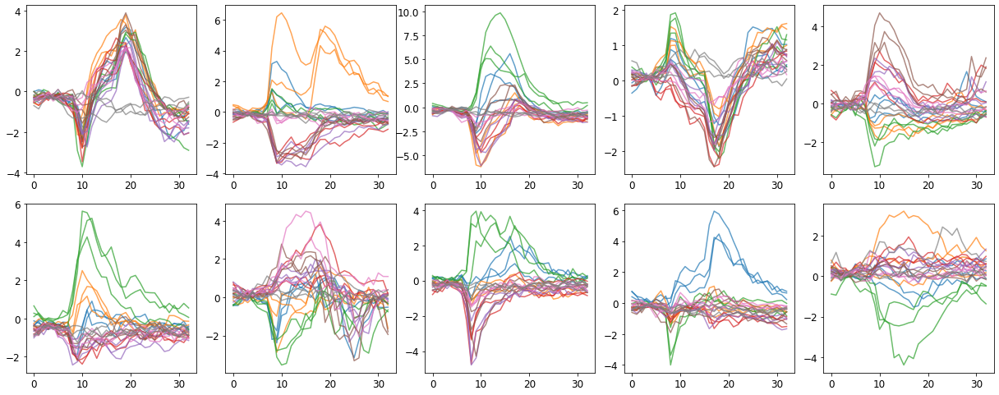

In [29]:
importlib.reload(emb)
plot_explist_svd_1d = ecl.plot_explist_decorator(emb.plot_embed_1d, csplus_dict, svd_dict)
csplus = 'phe'
region = 'Dp'
fig = plot_explist_svd_1d(csplus, region, 2)

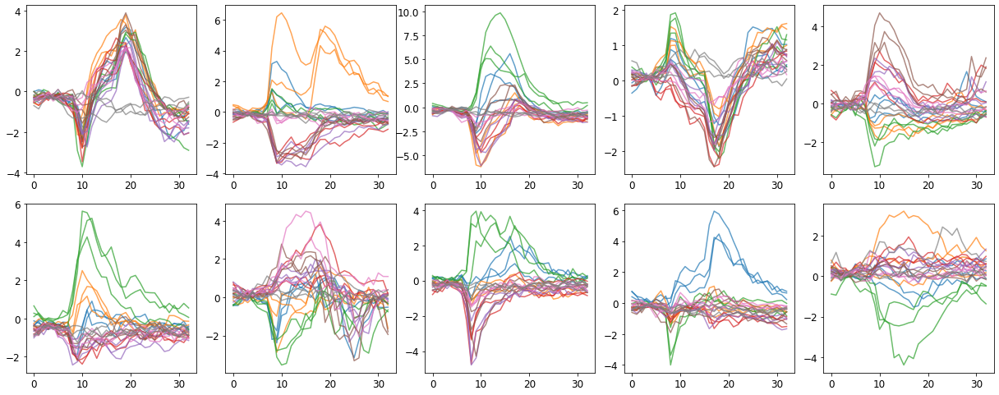

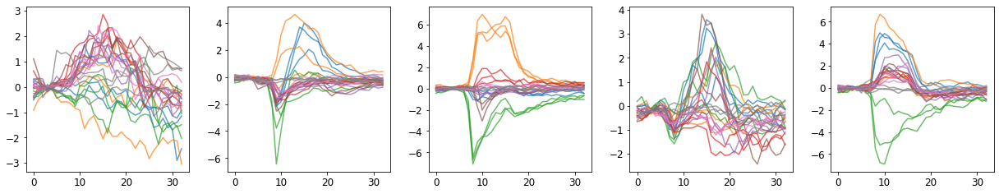

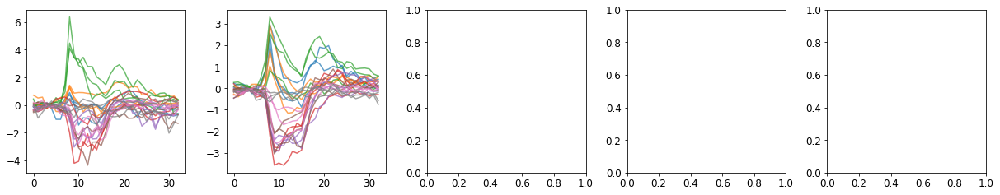

In [31]:
component = 2
region = 'Dp'
csplus_list = ['phe', 'arg', 'naive']
for csplus in csplus_list:
    fig = plot_explist_svd_1d(csplus, region, component)

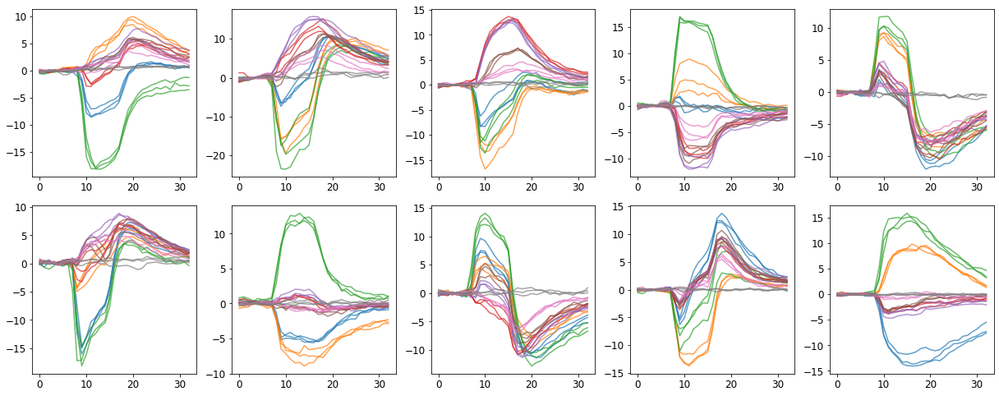

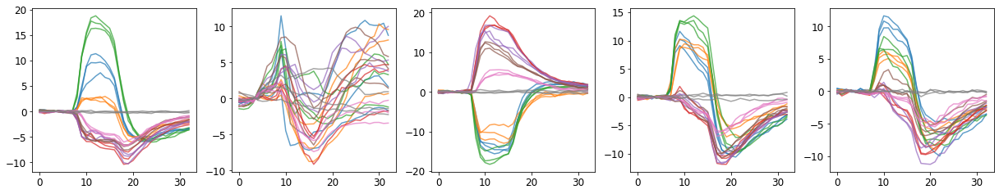

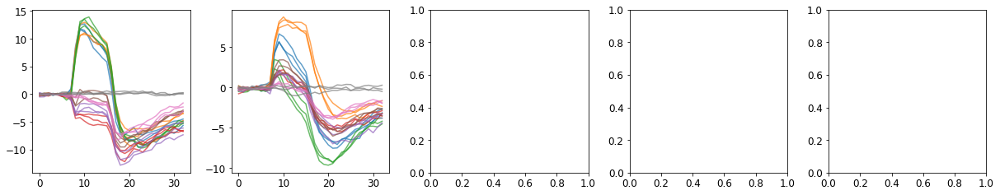

In [32]:
component = 2
region = 'OB'
csplus_list = ['phe', 'arg', 'naive']
for csplus in csplus_list:
    fig = plot_explist_svd_1d(csplus, region, component)

In [34]:
import rcca

In [117]:
# Create a cca object as an instantiation of the CCA object class. 
nComponents = 5
cca = rcca.CCA(kernelcca = False, reg = 0., numCC = nComponents)
region = 'Dp'
csplus = 'phe'
csexp_list = csplus_dict[csplus].copy()
csplus = 'arg'
csexp_list.extend(csplus_dict[csplus])
csplus = 'naive'
csexp_list.extend(csplus_dict[csplus])
# del csexp_list[9]
print(csexp_list)
data_list = [svd_dict[exp][region]['latent'] for exp in csexp_list]
# Use the train() method to find a CCA mapping between the two training sets.
cca.train(data_list)

['2021-02-05-DpOBEM-JH9', '2021-03-18-DpOBEM-JH10', '2021-03-19-DpOBEM-JH10', '2021-04-02-DpOBEM-JH11', '2021-04-03-DpOBEM-JH11', '2021-05-01-DpOBEM-JH13', '2021-05-22-DpOBEM-JH14', '2021-09-15-DpOBEM-JH20', '2021-09-17-DpOBEM-JH20', '2021-09-18-DpOBEM-JH20', '2021-07-30-DpOBEM-JH17', '2021-07-31-DpOBEM-JH17', '2021-09-02-DpOBEM-JH18', '2021-09-03-DpOBEM-JH18', '2021-09-04-DpOBEM-JH18', '2021-07-15-DpOBEM-N2', '2021-07-16-DpOBEM-N3']
Training CCA, kernel = None, regularization = 0.0000, 5 components


['phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'arg', 'arg', 'arg', 'arg', 'arg', 'naive', 'naive']


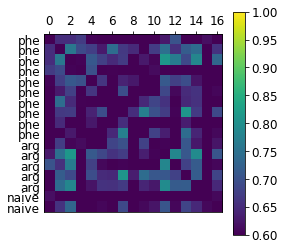

In [118]:
comp_idx = 4
cancorrs = cca.cancorrs[comp_idx]
#print(cancorrs[np.nonzero(cancorrs)].mean())
#print(cca.cancorrs[comp_idx])
plt.matshow(cca.cancorrs[comp_idx]+cca.cancorrs[comp_idx].T, clim=[0.6,1])
plt.colorbar()
xx_dict = dict(exp_list)
xx_list = [xx_dict[exp] for exp in csexp_list]
print(xx_list)
ax = plt.gca()
tick_pos = np.arange(len(xx_list))
ax.set_yticks(tick_pos)
ax.set_yticklabels(xx_list)
ax.yaxis.set_tick_params(length=0)
plt.tick_params(bottom=False)

In [128]:
def plot_cancorr_mat_mean(cancorr_mat, csplus_list, clim=(0.7,1)):
    cancorr_mat_mean = cancorr_mat.mean(axis=0)
    plot_cancorr_mat(cancorr_mat_mean, csplus_list, clim=clim)
def plot_cancorr_mat(cancorr_mat, csplus_list, clim=(0.7,1)):
    plt.matshow(cancorr_mat+cancorr_mat.T, clim=clim)
    ax = plt.gca()
    tick_pos = np.arange(nexp)
    ax.set_yticks(tick_pos)
    ax.set_yticklabels(csplus_list)
    plt.colorbar()

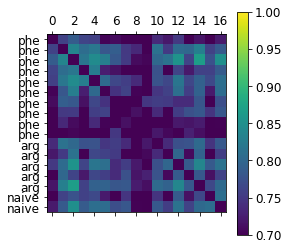

In [121]:
plot_cancorr_mat_mean(cca.cancorrs, xx_list)

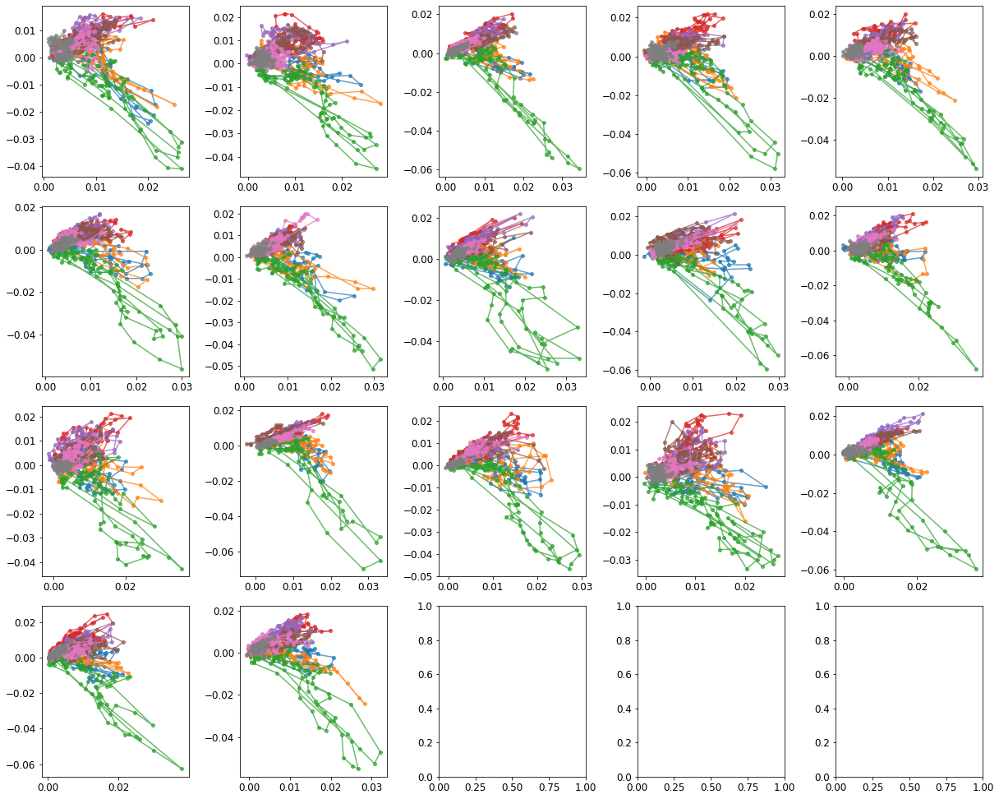

In [59]:
plot_func = emb.plot_embed_2d
ccacomp_list = [dict(latent=comps, index=svd_dict[exp_list[idx][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(0,1))

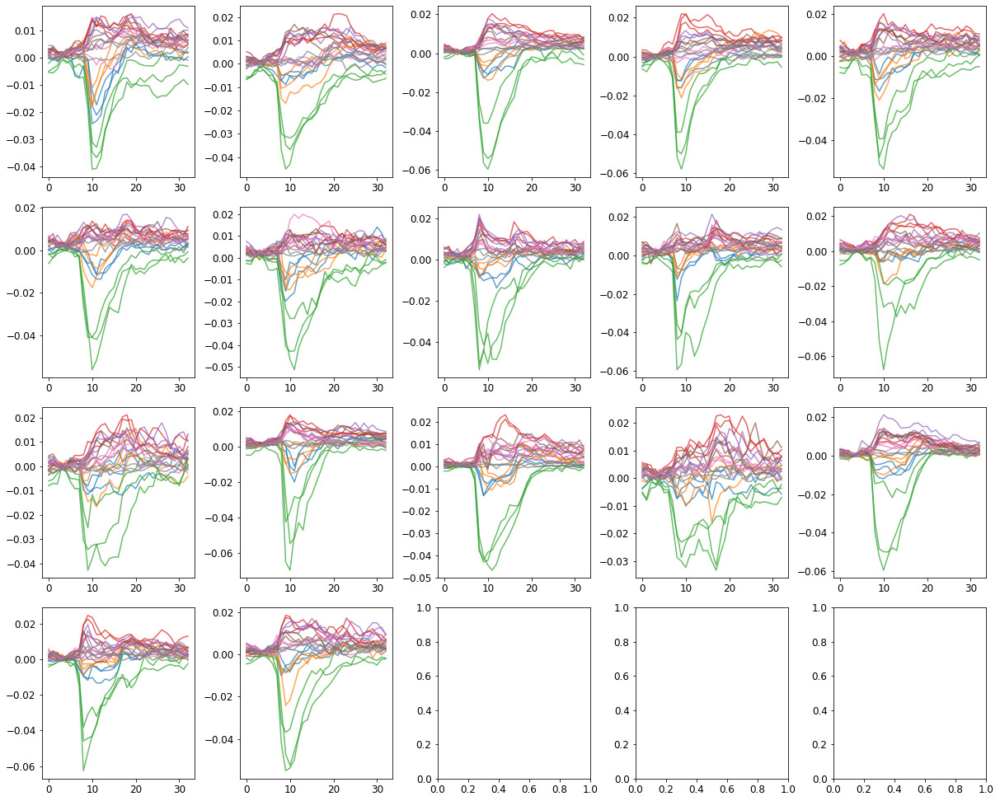

In [66]:
plot_func = emb.plot_embed_1d
ccacomp_list = [dict(latent=comps, index=svd_dict[exp_list[idx][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=1)

In [138]:
# Create a cca object as an instantiation of the CCA object class. 
nComponents = 5
cca = rcca.CCA(kernelcca = False, reg = 0., numCC = nComponents)
region = 'OB'
csplus = 'phe'
csexp_list = csplus_dict[csplus].copy()
csplus = 'arg'
csexp_list.extend(csplus_dict[csplus])
csplus = 'naive'
csexp_list.extend(csplus_dict[csplus])
# del csexp_list[9]
print(csexp_list)
data_list = [svd_dict[exp][region]['latent'] for exp in csexp_list]
# Use the train() method to find a CCA mapping between the two training sets.
cca.train(data_list)

['2021-02-05-DpOBEM-JH9', '2021-03-18-DpOBEM-JH10', '2021-03-19-DpOBEM-JH10', '2021-04-02-DpOBEM-JH11', '2021-04-03-DpOBEM-JH11', '2021-05-01-DpOBEM-JH13', '2021-05-22-DpOBEM-JH14', '2021-09-15-DpOBEM-JH20', '2021-09-17-DpOBEM-JH20', '2021-09-18-DpOBEM-JH20', '2021-07-30-DpOBEM-JH17', '2021-07-31-DpOBEM-JH17', '2021-09-02-DpOBEM-JH18', '2021-09-03-DpOBEM-JH18', '2021-09-04-DpOBEM-JH18', '2021-07-15-DpOBEM-N2', '2021-07-16-DpOBEM-N3']
Training CCA, kernel = None, regularization = 0.0000, 5 components


['phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'arg', 'arg', 'arg', 'arg', 'arg', 'naive', 'naive']


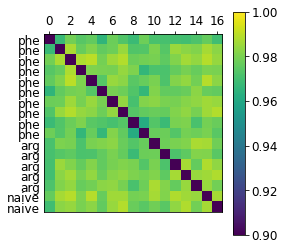

In [139]:
comp_idx = 0
cancorrs = cca.cancorrs[comp_idx]
#print(cancorrs[np.nonzero(cancorrs)].mean())
#print(cca.cancorrs[comp_idx])
plt.matshow(cca.cancorrs[comp_idx]+cca.cancorrs[comp_idx].T, clim=[0.9,1])
plt.colorbar()
xx_dict = dict(exp_list)
xx_list = [xx_dict[exp] for exp in csexp_list]
print(xx_list)
ax = plt.gca()
tick_pos = np.arange(len(xx_list))
ax.set_yticks(tick_pos)
ax.set_yticklabels(xx_list)
ax.yaxis.set_tick_params(length=0)
plt.tick_params(bottom=False)

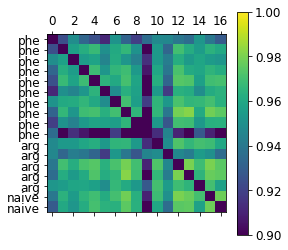

In [129]:
plot_cancorr_mat_mean(cca.cancorrs, xx_list, clim=(0.9,1))

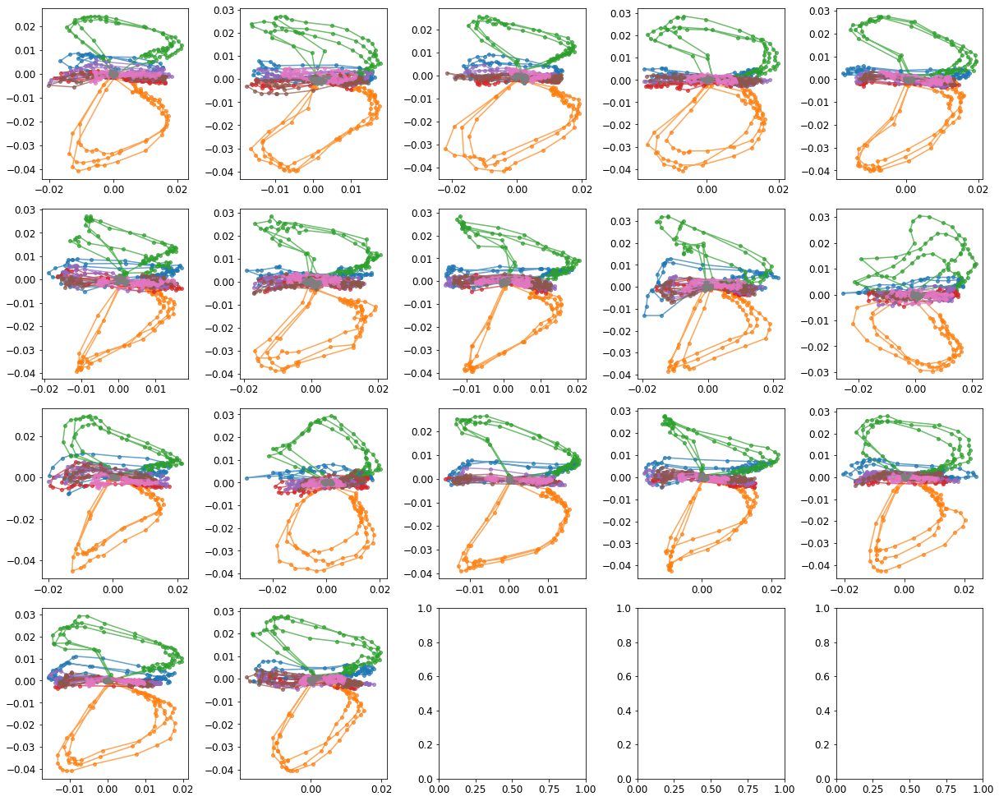

In [79]:
plot_func = emb.plot_embed_2d
ccacomp_list = [dict(latent=comps, index=svd_dict[exp_list[idx][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(2,3))

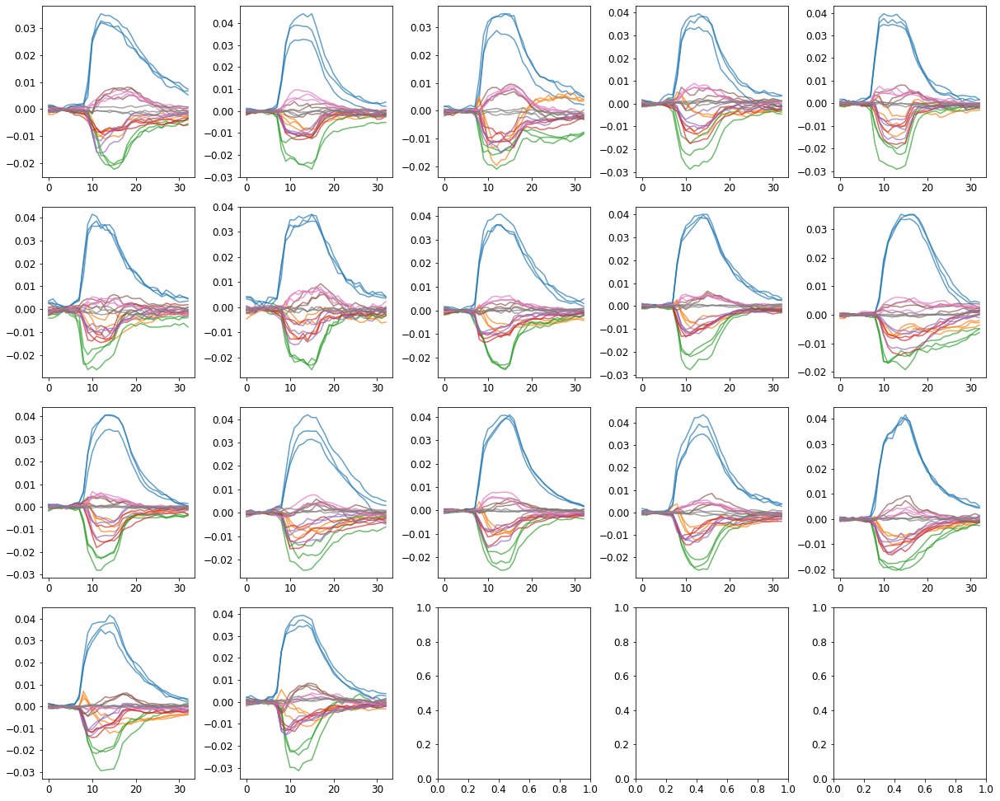

In [84]:
plot_func = emb.plot_embed_1d
ccacomp_list = [dict(latent=comps, index=svd_dict[exp_list[idx][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=4)

In [7]:
csplus = 'phe'
region = 'OB'
csexp_list = csplus_dict[csplus]
print(csexp_list)       
#        for idx,csexp in enumerate(csexp_list):
#            data = data_dict[csexp][region]
svd_dict[csexp_list[0]][region]

['2021-02-05-DpOBEM-JH9', '2021-03-18-DpOBEM-JH10', '2021-03-19-DpOBEM-JH10', '2021-04-02-DpOBEM-JH11', '2021-04-03-DpOBEM-JH11', '2021-05-01-DpOBEM-JH13', '2021-05-22-DpOBEM-JH14', '2021-09-15-DpOBEM-JH20', '2021-09-17-DpOBEM-JH20', '2021-09-18-DpOBEM-JH20']


NameError: name 'svd_dict' is not defined

In [74]:
exp_list

[('2021-02-05-DpOBEM-JH9', 'phe'),
 ('2021-03-18-DpOBEM-JH10', 'phe'),
 ('2021-03-19-DpOBEM-JH10', 'phe'),
 ('2021-04-02-DpOBEM-JH11', 'phe'),
 ('2021-04-03-DpOBEM-JH11', 'phe'),
 ('2021-05-01-DpOBEM-JH13', 'phe'),
 ('2021-05-22-DpOBEM-JH14', 'phe'),
 ('2021-07-15-DpOBEM-N2', 'naive'),
 ('2021-07-16-DpOBEM-N3', 'naive'),
 ('2021-07-30-DpOBEM-JH17', 'arg'),
 ('2021-07-31-DpOBEM-JH17', 'arg'),
 ('2021-09-02-DpOBEM-JH18', 'arg'),
 ('2021-09-03-DpOBEM-JH18', 'arg'),
 ('2021-09-04-DpOBEM-JH18', 'arg'),
 ('2021-09-15-DpOBEM-JH20', 'phe'),
 ('2021-09-17-DpOBEM-JH20', 'phe'),
 ('2021-09-18-DpOBEM-JH20', 'phe')]

In [78]:
region = 'Dp'

In [91]:
exp1 = '2021-09-15-DpOBEM-JH20'
latent = svd_dict[exp1][region]['latent']
print(latent.shape)

(792, 10)


In [94]:
exp1 = '2021-04-03-DpOBEM-JH11'
latent = svd_dict[exp1][region]['latent']
latent = pattern_dict[exp1][region]
print(latent.shape)

(792, 1222)


Training CCA, kernel = None, regularization = 0.0000, 4 components
0.8625461221241097
[[0.         0.82438512 0.90853627 0.88506986 0.88750647]
 [0.         0.         0.84993738 0.78335174 0.81162693]
 [0.         0.         0.         0.89805079 0.88943886]
 [0.         0.         0.         0.         0.8875578 ]
 [0.         0.         0.         0.         0.        ]]


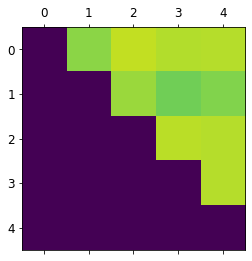

In [59]:
# Create a cca object as an instantiation of the CCA object class. 
nComponents = 4
cca = rcca.CCA(kernelcca = False, reg = 0., numCC = nComponents)
csplus = 'arg'
region = 'Dp'
csexp_list = csplus_dict[csplus].copy()
# csexp_list = csexp_list[:-3]
data_list = [svd_dict[exp][region]['latent'] for exp in csexp_list]
# Use the train() method to find a CCA mapping between the two training sets.
cca.train(data_list)
cancorrs = cca.cancorrs[0]
print(cancorrs[np.nonzero(cancorrs)].mean())
print(cca.cancorrs[0])
plt.matshow(cca.cancorrs[0], clim=[0,1])

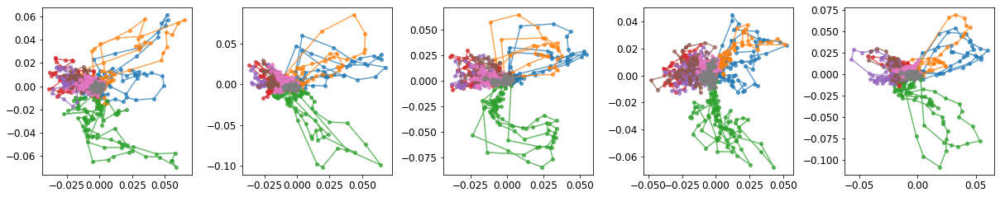

In [61]:
plot_func = emb.plot_embed_2d
ccacomp_list = [dict(latent=comps, index=svd_dict[exp_list[idx][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(1,2))

In [47]:
for idx,comps in enumerate(cca.comps):
    print(exp_list[idx])
    #print(svd_dict[exp_list[idx]][region]['index'])

('2021-02-05-DpOBEM-JH9', 'phe')
('2021-03-18-DpOBEM-JH10', 'phe')
('2021-03-19-DpOBEM-JH10', 'phe')
('2021-04-02-DpOBEM-JH11', 'phe')
('2021-04-03-DpOBEM-JH11', 'phe')
('2021-05-01-DpOBEM-JH13', 'phe')
('2021-05-22-DpOBEM-JH14', 'phe')


Training CCA, kernel = None, regularization = 0.0000, 4 components
0.8625461221241097
[[0.         0.82438512 0.90853627 0.88506986 0.88750647]
 [0.         0.         0.84993738 0.78335174 0.81162693]
 [0.         0.         0.         0.89805079 0.88943886]
 [0.         0.         0.         0.         0.8875578 ]
 [0.         0.         0.         0.         0.        ]]


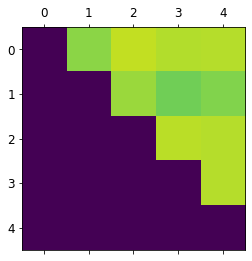

In [143]:
# Create a cca object as an instantiation of the CCA object class. 
nComponents = 4
cca = rcca.CCA(kernelcca = False, reg = 0., numCC = nComponents)
csplus = 'arg'
region = 'Dp'
csexp_list = csplus_dict[csplus]
data_list = [svd_dict[exp][region]['latent'] for exp in csexp_list]
# Use the train() method to find a CCA mapping between the two training sets.
cca.train(data_list)
cancorrs = cca.cancorrs[0]
print(cancorrs[np.nonzero(cancorrs)].mean())
print(cca.cancorrs[0])
plt.matshow(cca.cancorrs[0], clim=[0,1])

['2021-02-05-DpOBEM-JH9', '2021-03-18-DpOBEM-JH10', '2021-03-19-DpOBEM-JH10', '2021-04-02-DpOBEM-JH11', '2021-04-03-DpOBEM-JH11', '2021-05-01-DpOBEM-JH13', '2021-05-22-DpOBEM-JH14', '2021-09-15-DpOBEM-JH20', '2021-09-17-DpOBEM-JH20', '2021-09-18-DpOBEM-JH20', '2021-07-30-DpOBEM-JH17', '2021-07-31-DpOBEM-JH17', '2021-09-02-DpOBEM-JH18', '2021-09-03-DpOBEM-JH18', '2021-09-04-DpOBEM-JH18', '2021-07-15-DpOBEM-N2', '2021-07-16-DpOBEM-N3']
Training CCA, kernel = None, regularization = 0.0000, 4 components
0.8318730840938496
[[0.         0.83538962 0.82222944 0.75207436 0.82251134 0.83687849
  0.80701229 0.74157525 0.69425952 0.78189927 0.77615651 0.79048028
  0.80175533 0.76904722 0.78334449 0.77425929 0.79957205]
 [0.         0.         0.8890785  0.86144969 0.9040589  0.87727661
  0.84954974 0.83687131 0.82354639 0.82241043 0.85647993 0.80482815
  0.85438037 0.85356977 0.85019168 0.82907011 0.88108277]
 [0.         0.         0.         0.89789966 0.92996975 0.88279267
  0.88019734 0.88737

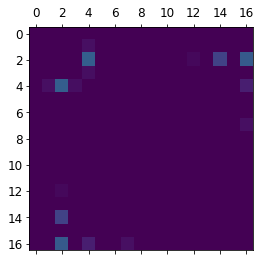

In [71]:
# Create a cca object as an instantiation of the CCA object class. 
nComponents = 4
cca = rcca.CCA(kernelcca = False, reg = 0., numCC = nComponents)
csplus = 'phe'
region = 'Dp'
csexp_list = csplus_dict[csplus].copy()
csplus = 'arg'
csexp_list.extend(csplus_dict[csplus])
csplus = 'naive'
csexp_list.extend(csplus_dict[csplus])
# del csexp_list[9]
print(csexp_list)
data_list = [svd_dict[exp][region]['latent'] for exp in csexp_list]
# Use the train() method to find a CCA mapping between the two training sets.
cca.train(data_list)
comp_idx = 1
cancorrs = cca.cancorrs[comp_idx]
print(cancorrs[np.nonzero(cancorrs)].mean())
print(cca.cancorrs[comp_idx])
plt.matshow(cca.cancorrs[comp_idx]+cca.cancorrs[comp_idx].T, clim=[0.9,1])

['phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'arg', 'arg', 'arg', 'arg', 'arg', 'naive', 'naive']


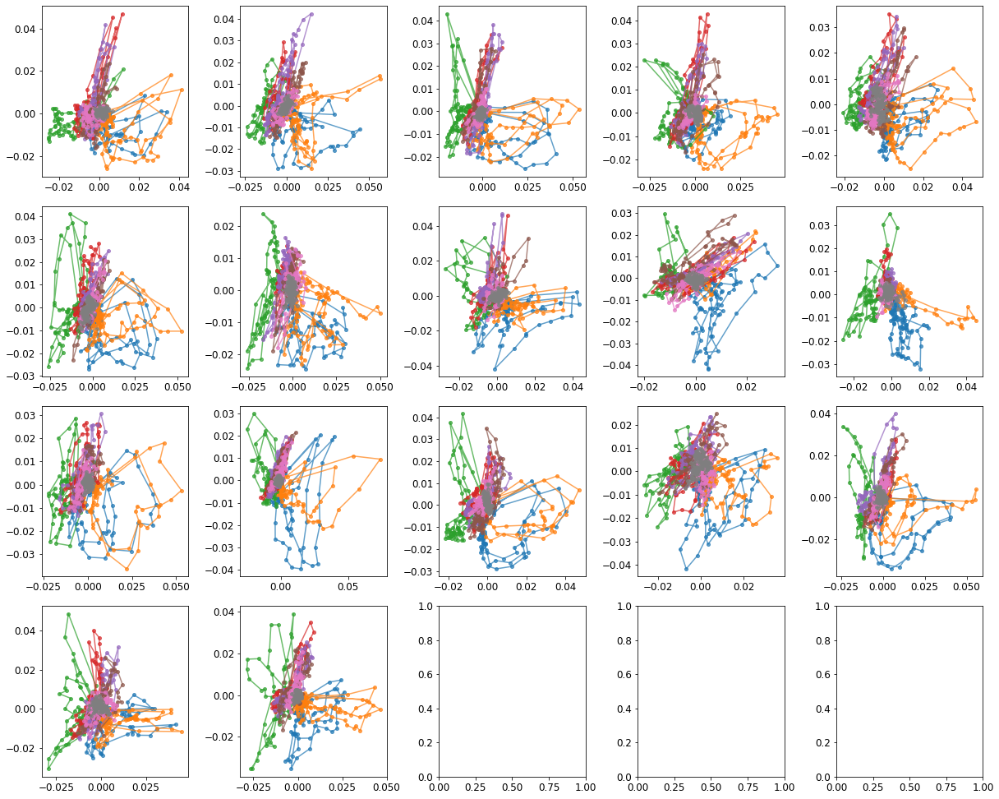

In [75]:
importlib.reload(ecl)
xx_dict = dict(exp_list)
xx_list = [xx_dict[exp] for exp in csexp_list]
print(xx_list)
plot_func = emb.plot_embed_2d
ccacomp_list = [dict(latent=comps, index=svd_dict[exp_list[idx][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(2,3))

In [ ]:
#TODO plot_trace_trial_avg
importlib.reload(ecl)
xx_dict = dict(exp_list)
xx_list = [xx_dict[exp] for exp in csexp_list]
print(xx_list)
plot_func = emb.plot_embed_2d
ccacomp_list = [dict(latent=comps, index=svd_dict[exp_list[idx][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(2,3))

In [130]:
# Create a cca object as an instantiation of the CCA object class. 
n_components = 5

csplus = 'phe'
region = 'OB'
csexp_list = csplus_dict[csplus].copy()
csplus = 'arg'
csexp_list.extend(csplus_dict[csplus])
# del csexp_list[9]
csplus = 'naive'
csexp_list.extend(csplus_dict[csplus])
print(csexp_list)
xx_dict = dict(exp_list)
xx_list = [xx_dict[exp] for exp in csexp_list]
data_list = [svd_dict[exp][region]['latent'] for exp in csexp_list]
# Use the train() method to find a CCA mapping between the two training sets.

nexp = len(csexp_list)
cancorr_mat = np.zeros((n_components, nexp, nexp))
for k in range(nexp):
    for j in range(k):
        cca = rcca.CCA(kernelcca = False, reg = 0., numCC = n_components)
        cca.train([data_list[k],data_list[j]])
        cancorr_mat[:,k,j] = cca.cancorrs

['2021-02-05-DpOBEM-JH9', '2021-03-18-DpOBEM-JH10', '2021-03-19-DpOBEM-JH10', '2021-04-02-DpOBEM-JH11', '2021-04-03-DpOBEM-JH11', '2021-05-01-DpOBEM-JH13', '2021-05-22-DpOBEM-JH14', '2021-09-15-DpOBEM-JH20', '2021-09-17-DpOBEM-JH20', '2021-09-18-DpOBEM-JH20', '2021-07-30-DpOBEM-JH17', '2021-07-31-DpOBEM-JH17', '2021-09-02-DpOBEM-JH18', '2021-09-03-DpOBEM-JH18', '2021-09-04-DpOBEM-JH18', '2021-07-15-DpOBEM-N2', '2021-07-16-DpOBEM-N3']
Training CCA, kernel = None, regularization = 0.0000, 5 components
Training CCA, kernel = None, regularization = 0.0000, 5 components
Training CCA, kernel = None, regularization = 0.0000, 5 components
Training CCA, kernel = None, regularization = 0.0000, 5 components
Training CCA, kernel = None, regularization = 0.0000, 5 components
Training CCA, kernel = None, regularization = 0.0000, 5 components
Training CCA, kernel = None, regularization = 0.0000, 5 components
Training CCA, kernel = None, regularization = 0.0000, 5 components
Training CCA, kernel = Non

Training CCA, kernel = None, regularization = 0.0000, 5 components
Training CCA, kernel = None, regularization = 0.0000, 5 components
Training CCA, kernel = None, regularization = 0.0000, 5 components


['phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'arg', 'arg', 'arg', 'arg', 'arg', 'naive', 'naive']


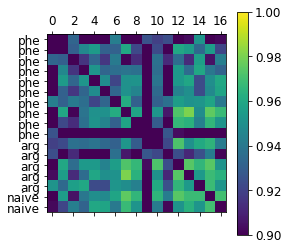

In [136]:
comp_idx = 4
plt.matshow(cancorr_mat[comp_idx]+cancorr_mat[comp_idx].T, clim=[0.9,1])
ax = plt.gca()
tick_pos = np.arange(nexp)
ax.set_yticks(tick_pos)
ax.set_yticklabels(xx_list)
plt.colorbar()

print(xx_list)

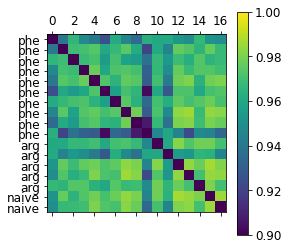

In [137]:
plot_cancorr_mat_mean(cancorr_mat, xx_list, clim=(0.9,1))

In [32]:
importlib.reload(ecl)
importlib.reload(emb)
#compute_pca_explist = ecl.get_data_dict_decorator(exp_list, region_list, pattern_dict, emb.compute_pca)

In [33]:
compute_pca_explist = ecl.get_data_dict_decorator(exp_list, region_list, pattern_dict, emb.compute_pca)
n_components = 10
pca_dict = compute_pca_explist(n_components)

2021-02-05-DpOBEM-JH9 Dp
2021-02-05-DpOBEM-JH9 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-18-DpOBEM-JH10 Dp
2021-03-18-DpOBEM-JH10

/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-19-DpOBEM-JH10 Dp
2021-03-19-DpOBEM-JH10 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-02-DpOBEM-JH11 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-02-DpOBEM-JH11 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-03-DpOBEM-JH11 Dp
2021-04-03-DpOBEM-JH11 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-01-DpOBEM-JH13 Dp
2021-05-01-DpOBEM-JH13 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-22-DpOBEM-JH14 Dp
2021-05-22-DpOBEM-JH14 OB
2021-07-15-DpOBEM-N2 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-15-DpOBEM-N2 OB
2021-07-16-DpOBEM-N3 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-16-DpOBEM-N3 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-30-DpOBEM-JH17 Dp
2021-07-30-DpOBEM-JH17 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-31-DpOBEM-JH17 Dp
2021-07-31-DpOBEM-JH17 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-02-DpOBEM-JH18 Dp
2021-09-02-DpOBEM-JH18 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-03-DpOBEM-JH18 Dp
2021-09-03-DpOBEM-JH18 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-04-DpOBEM-JH18 Dp
2021-09-04-DpOBEM-JH18 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-15-DpOBEM-JH20 Dp
2021-09-15-DpOBEM-JH20 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-17-DpOBEM-JH20 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-17-DpOBEM-JH20 OB
2021-09-18-DpOBEM-JH20 Dp


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-18-DpOBEM-JH20 OB


/home/hubo/Softwares/anaconda3/envs/catrace/lib/python3.9/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


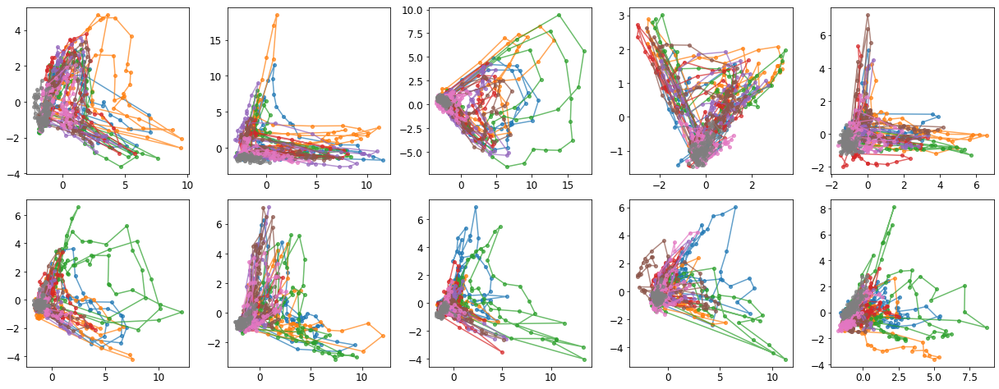

In [41]:
importlib.reload(emb)
plot_explist_pca = plot_explist_decorator(emb.plot_embed_2d,pca_dict)
csplus = 'phe'
region = 'Dp'
fig = plot_explist_pca(csplus, region, (0,1))

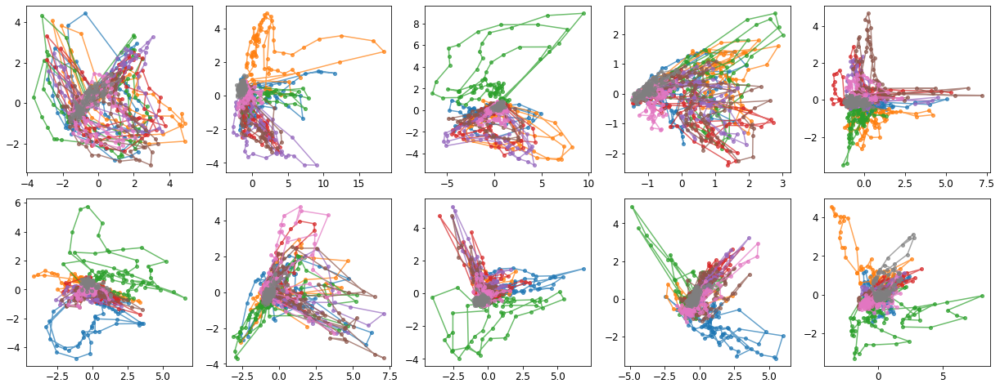

In [42]:
csplus = 'phe'
region = 'Dp'
fig = plot_explist_pca(csplus, region, (1,2))

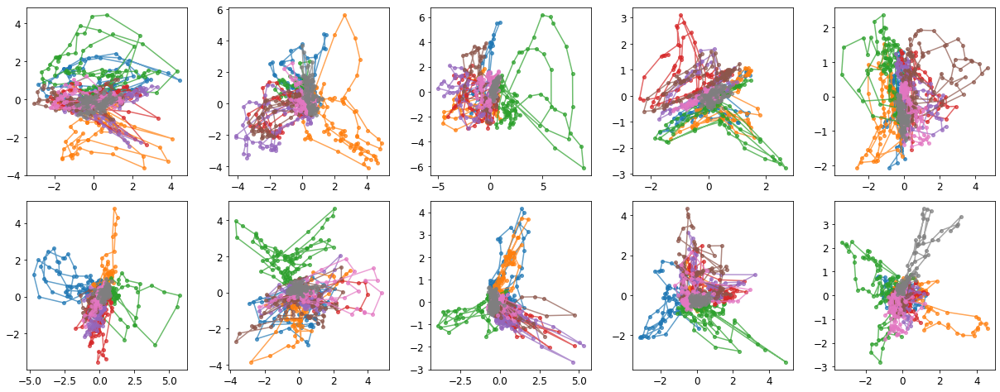

In [43]:
csplus = 'phe'
region = 'Dp'
fig = plot_explist_pca(csplus, region, (2,3))

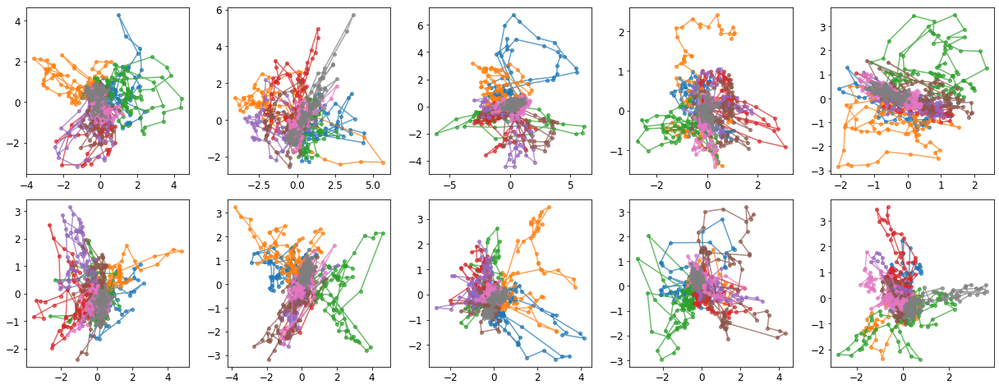

In [44]:
csplus = 'phe'
region = 'Dp'
fig = plot_explist_pca(csplus, region, (3,4))

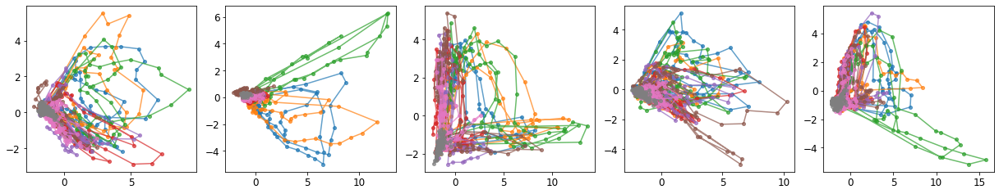

In [45]:
csplus = 'arg'
region = 'Dp'
fig = plot_explist_pca(csplus, region, (0,1))

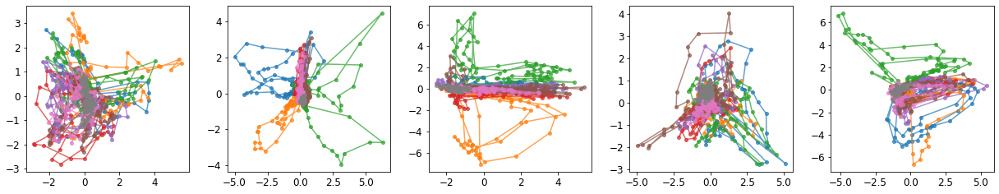

In [46]:
csplus = 'arg'
region = 'Dp'
fig = plot_explist_pca(csplus, region, (1,2))

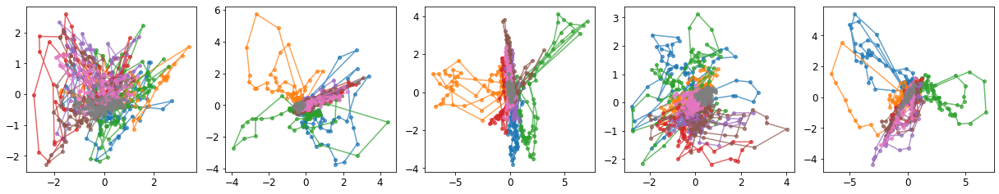

In [47]:
csplus = 'arg'
region = 'Dp'
fig = plot_explist_pca(csplus, region, (2,3))

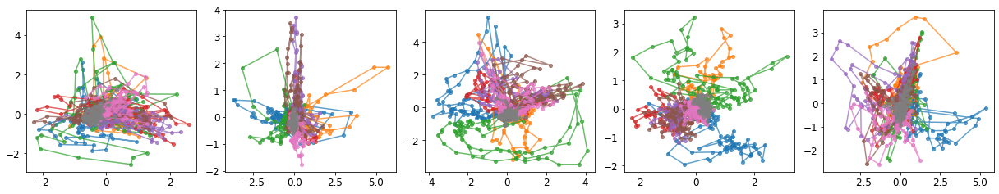

In [48]:
csplus = 'arg'
region = 'Dp'
fig = plot_explist_pca(csplus, region, (3,4))

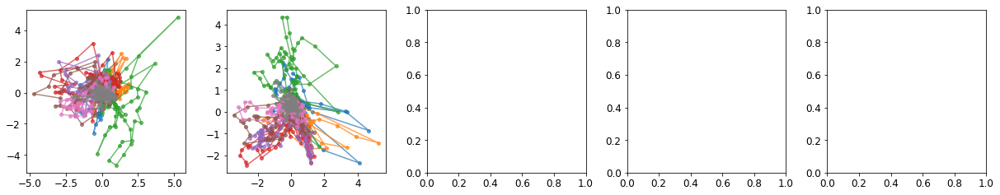

In [49]:
csplus = 'naive'
region = 'Dp'
fig = plot_explist_pca(csplus, region, (2,3))

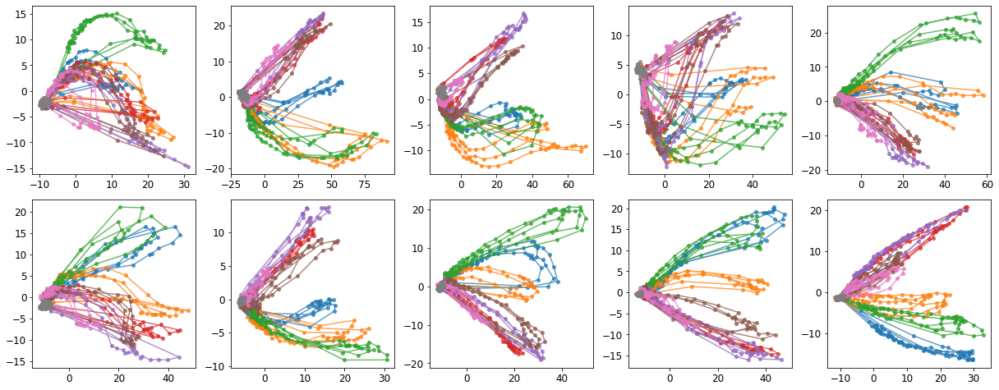

In [50]:
csplus = 'phe'
region = 'OB'
fig = plot_explist_pca(csplus, region, (0,1))

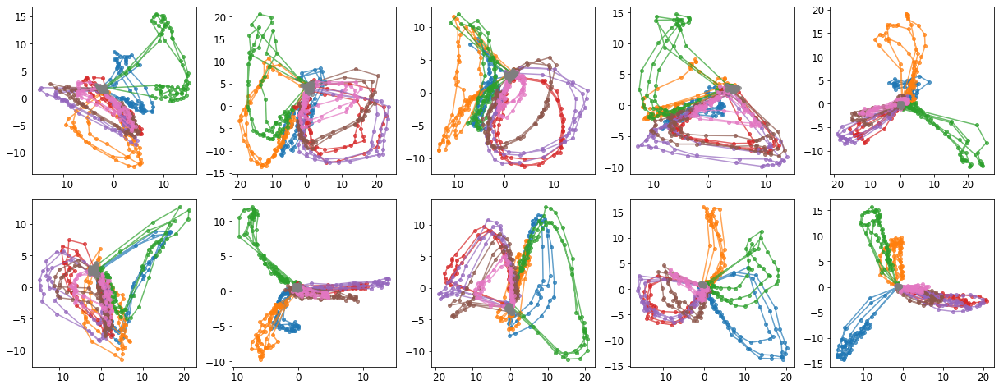

In [51]:
csplus = 'phe'
region = 'OB'
fig = plot_explist_pca(csplus, region, (1,2))

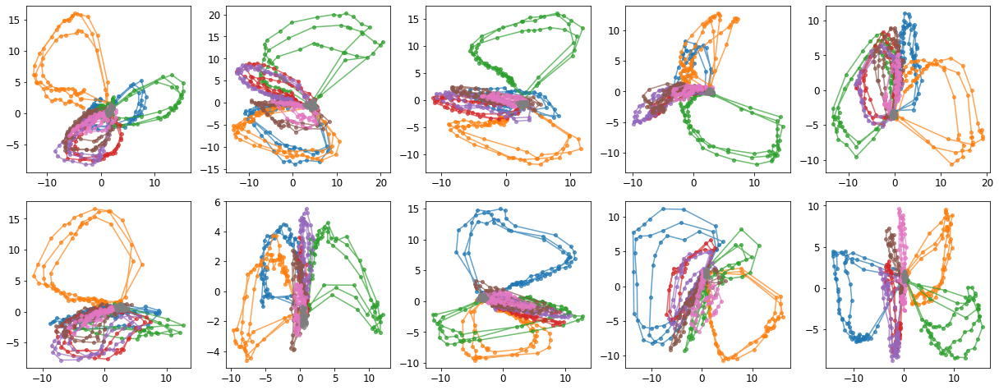

In [52]:
csplus = 'phe'
region = 'OB'
fig = plot_explist_pca(csplus, region, (2,3))

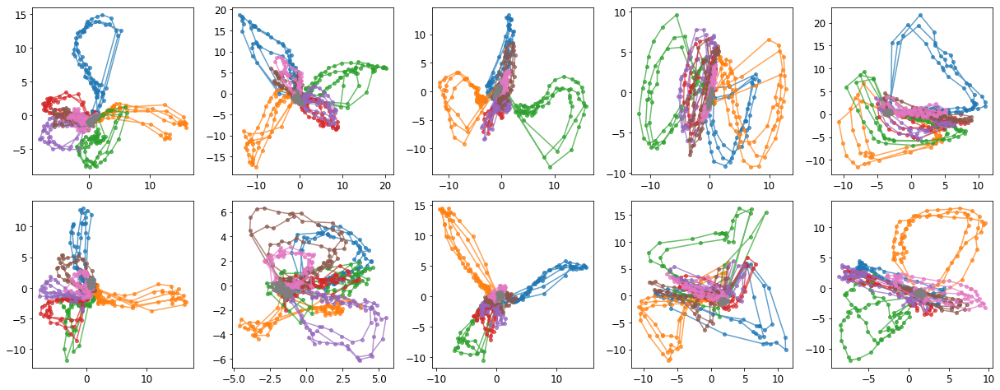

In [53]:
csplus = 'phe'
region = 'OB'
fig = plot_explist_pca(csplus, region, (3,4))

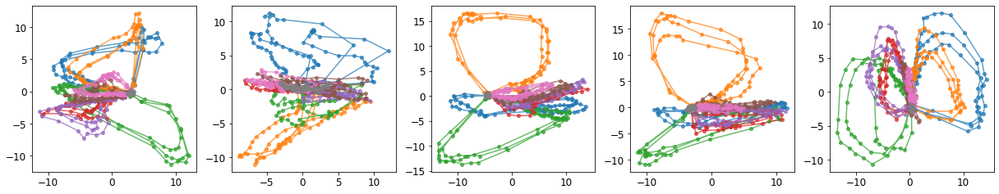

In [54]:
csplus = 'arg'
region = 'OB'
fig = plot_explist_pca(csplus, region, (2,3))

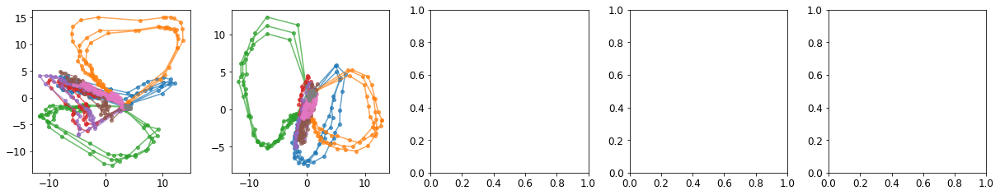

In [55]:
csplus = 'naive'
region = 'OB'
fig = plot_explist_pca(csplus, region, (2,3))

In [35]:
# TODO correct this!
# neuron + plane number together defines the neuron identity
def count_neuron(df):
    neuron_idx = df.index.get_level_values('neuron')
    plane_idx = df.index.get_level_values('plane')
    idx = set(zip(neuron_idx, plane_idx))
    return len(idx)
for region in region_list: 
    for exp in exp_list:
        exp_name = exp[0]
        df = dfovf_dict[exp_name][region]
        print(exp_name, region, count_neuron(df))

2021-02-05-DpOBEM-JH9 Dp 1588
2021-03-18-DpOBEM-JH10 Dp 1949
2021-03-19-DpOBEM-JH10 Dp 1873
2021-04-02-DpOBEM-JH11 Dp 1656
2021-04-03-DpOBEM-JH11 Dp 1222
2021-05-01-DpOBEM-JH13 Dp 826
2021-05-22-DpOBEM-JH14 Dp 735
2021-07-15-DpOBEM-N2 Dp 1299
2021-07-16-DpOBEM-N3 Dp 1398
2021-07-30-DpOBEM-JH17 Dp 1325
2021-07-31-DpOBEM-JH17 Dp 1509
2021-09-02-DpOBEM-JH18 Dp 1469
2021-09-03-DpOBEM-JH18 Dp 1031
2021-09-04-DpOBEM-JH18 Dp 1350
2021-09-15-DpOBEM-JH20 Dp 913
2021-09-17-DpOBEM-JH20 Dp 1453
2021-09-18-DpOBEM-JH20 Dp 1164
2021-02-05-DpOBEM-JH9 OB 2205
2021-03-18-DpOBEM-JH10 OB 2560
2021-03-19-DpOBEM-JH10 OB 2013
2021-04-02-DpOBEM-JH11 OB 2438
2021-04-03-DpOBEM-JH11 OB 2421
2021-05-01-DpOBEM-JH13 OB 2023
2021-05-22-DpOBEM-JH14 OB 1306
2021-07-15-DpOBEM-N2 OB 1721
2021-07-16-DpOBEM-N3 OB 1959
2021-07-30-DpOBEM-JH17 OB 1845
2021-07-31-DpOBEM-JH17 OB 1536
2021-09-02-DpOBEM-JH18 OB 1847
2021-09-03-DpOBEM-JH18 OB 1923
2021-09-04-DpOBEM-JH18 OB 1551
2021-09-15-DpOBEM-JH20 OB 1533
2021-09-17-DpOBEM-JH2

In [17]:
df = dfovf_dict[exp_name][region]
len(df.index.get_level_values('neuron').unique())

Int64Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,
            ...
            569, 570, 571, 572, 573, 574, 575, 576, 577, 578],
           dtype='int64', name='neuron', length=579)